# Create basic analysis data

In [2]:
from __future__ import print_function
%matplotlib inline
import mdtraj as md
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy
from scipy.spatial.distance import squareform
import pandas as pd
import matplotlib.gridspec as gridspec
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings('ignore')
import MDAnalysis as mda
from statistics import mode
import ast
import msmexplorer as msme
from msmbuilder.utils import load,dump
import itertools
from msmbuilder.featurizer import ContactFeaturizer
from msmbuilder.featurizer import DihedralFeaturizer
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
#XRD Ensemble
#28 4NPQ
#18 4HFI

## Default values

In [3]:
traj_notes = [ '5NJY_F238L_pH70_md1','5NJY_F238L_pH70_ethanol_md1']
default_location = '/home/scottzhuang/pdc/'
default_skip = 10

In [4]:
ensemble_location = '/home/scottzhuang/masterthesis/miscellanies/pdb_ensemble/'

## Steps
1. Fix periodic boundary conditions (PBC) & choose a suitable timestep.
2. transform gro file into pdb file with chain information recovered.
3. create metadata
4. calculate RMSD, RMSF, PCA... & cluster
5. extract gating features & hydration data
6. extract HBond information of TMD
7. plotting Hbond mapping & elucidate important interactions
8. geometric features (dihedral angle...)
9. analysis data

In [5]:
traj_notes = ['4HFI_pH46_md4','4HFI_pH46_md5','4HFI_pH46_md6',
              '4HFI_pH46_md7','4HFI_pH46_md8','4HFI_pH46_md9',
              '5NJY_pH46_md1','5NJY_pH46_md2','5NJY_pH46_md3',
              '5NJY_pH70_md1','5NJY_pH70_md2','5NJY_pH70_md3',
              '4NPQ_pH70_md5','4NPQ_pH70_md6','4NPQ_pH70_md7']

### step1
using script **pre_fixing.sh**

### step2

In [6]:
def recover_chainid_ca(traj_note):
    location = default_location
    skip = default_skip
    top_location = location + traj_note + '/' + traj_note + ".ca.gro"
    traj = md.load(top_location)
    topology = traj.topology
    table, bonds = topology.to_dataframe()
    for i in range (0,5):
        table.loc[311*i:311*i + 311,'chainID'] = i
    t2 = md.Topology.from_dataframe(table, bonds)
    traj.topology = t2
    traj.save_pdb(location + traj_note + '/' + traj_note +'.ca.pdb')

In [7]:
def recover_chainid_protein(traj_note):
    location = default_location
    skip = default_skip
    top_location = location + traj_note + '/' + traj_note + ".protein.gro"
    traj = md.load(top_location)
    topology = traj.topology
    table, bonds = topology.to_dataframe()
    chain_start_index = list(table[(table['resSeq'] == 5) & (table['name'] == 'MN1')].index)
    chain_end_index = list(table[(table['resSeq'] == 315) & (table['name'] == 'OXT')].index)
    for i in range (0,5):
        table.loc[chain_start_index[i]:chain_end_index[i]+1,'chainID'] = i
    table.loc[chain_end_index[i]+1:,'chainID'] = 5
    t2 = md.Topology.from_dataframe(table, bonds)
    traj.topology = t2
    traj.save_pdb(location + traj_note + '/' + traj_note +'.protein.pdb')

In [8]:
def recover_chainid_system(traj_note):
    location = default_location
    skip = default_skip
    top_location = location + traj_note + '/' + traj_note + ".system.gro"
    traj = md.load(top_location)
    topology = traj.topology
    table, bonds = topology.to_dataframe()
    chain_start_index = list(table[(table['resSeq'] == 5) & (table['name'] == 'MN1')].index)
    chain_end_index = list(table[(table['resSeq'] == 315) & (table['name'] == 'OXT')].index)
    for i in range (0,5):
        table.loc[chain_start_index[i]:chain_end_index[i]+1,'chainID'] = i
    table.loc[chain_end_index[i]+1:,'chainID'] = 5
    table.loc[table.resName == 'HOH','resSeq'] = 1000
    table.loc[table.resName == 'HOH','chainID'] = 6
    t2 = md.Topology.from_dataframe(table, bonds)
    traj.topology = t2
    traj.save_pdb(location + traj_note + '/' + traj_note +'.system.pdb')

In [131]:
traj_notes = [ '4NPQ_I233T_pH70_md3','4NPQ_I233T_pH70_md4','4NPQ_I233T_pH70_md5','4NPQ_I233T_pH70_ethanol_md1','4NPQ_I233T_pH70_ethanol_md2','4NPQ_I233T_pH70_ethanol_md3']

In [11]:
traj_notes = ['4NPQ_pH70_ethanol_md1','4NPQ_pH70_ethanol_md2','4NPQ_pH70_ethanol_md3']

In [18]:
default_location='/media/scottzhuang/data/MD/md_prep/'

In [16]:
traj_notes = ['4HFI_pH70_md1','4HFI_pH70_ethanol_md1']

In [19]:
from joblib import Parallel, delayed
import multiprocessing
num_cores = multiprocessing.cpu_count()
Parallel(n_jobs=num_cores)(delayed(recover_chainid_ca)(traj_note) for traj_note in traj_notes)
Parallel(n_jobs=num_cores)(delayed(recover_chainid_protein)(traj_note) for traj_note in traj_notes)
#Parallel(n_jobs=num_cores)(delayed(recover_chainid_system)(traj_note) for traj_note in traj_notes)

[None, None]

### Step 3

In [9]:
def create_md_dataframe():    
    md_data = pd.DataFrame(columns=list(['MD_name','pH','replicate','traj_time','ethanol']))
    return md_data

In [10]:
def create_metadata(md_data= None):   
    def append_metadata(traj_note, location = default_location, skip = default_skip, md_data = md_data):
        if traj_note.find('ethanol') >= 0:
            file_skip = skip * 2
            top_location = traj_note + '/' + traj_note + ".ca.gro"
            traj_location = traj_note + '/' + traj_note + ".skip" + str(file_skip) + ".ca.xtc"
            traj = md.load(location + traj_location,top= location + top_location)
        else:
            top_location = traj_note + '/' + traj_note + ".ca.gro"
            traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
            traj = md.load(location + traj_location,top= location + top_location)
        print("In " + traj_note + ", simulation runs " + str(skip * traj.n_frames) + " ns.")
        md_name = traj_note[:traj_note.find('pH')-1]
        pH = traj_note[traj_note.find('pH')+2:traj_note.find('pH')+4]
        md_replicate = traj_note[-1]
        ethanol = traj_note.find('ethanol')>1
        for i in range(0,traj.n_frames):
            md_data.loc[md_data.shape[0]+1] = [md_name,pH,md_replicate,i,ethanol]

    for traj_note in traj_notes:
        append_metadata(traj_note)

In [12]:
def create_system_notation(md_data = None):
    system_notation = 0
    notation = -1
    location = default_location
    skip= default_skip

    notations = []
    increment = 0
    for traj_note in traj_notes:
        if traj_note.find('ethanol') >= 0:
            top_location = traj_note + '/' + traj_note + ".ca.gro"
            traj_location = traj_note + '/' + traj_note + ".skip" + str(skip*2) + ".ca.xtc"
        else:
            top_location = traj_note + '/' + traj_note + ".ca.gro"
            traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top= location + top_location)
        if traj_note.find('md1') >= 0:
            notation = notation + 1
        if traj_note == '5NJY_I233T_pH70_md4' or traj_note == '4NPQ_pH70_md5' or  traj_note == '4NPQ_F238L_pH70_md3' or traj_note == '4NPQ_I233T_pH70_md3' or traj_note == '4NPQ_F238LI233T_pH70_md3' or traj_note == '4HFI_F238L_pH46_md4' or traj_note == '4HFI_F238L_pH46_md7':
            notation = notation + 1

        for frame in range(0,traj.n_frames):
            notations.append(notation)
        #if increment % 3 == 2:
        #    notation = notation + 1
        #increment = increment + 1 
    md_data['system'] = notations

In [13]:
def create_rmsd_data(md_data= None, ref_name = None, select_domain = None):
    def append_rmsd_data(traj_note, location = default_location, ref_name = None, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        residue_selection_1 = "resSeq 13 to 198"
        residue_selection_2 = "resSeq 198 to 316"
        top_location = traj_note + '/' + traj_note + ".ca.gro"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top= location + top_location)
        if select_domain == 'TMD':
            traj = traj.atom_slice(traj.topology.select(residue_selection_2))
        elif select_domain == 'ECD':
            traj = traj.atom_slice(traj.topology.select(residue_selection_1))

        if ref_name != None:
            ref_location = ("/home/scottzhuang/masterthesis/miscellanies/pdb_ensemble/" + ref_name + "_1.mer.pdb")
        else:
            ref_location = location + top_location
        ref_traj = md.load(ref_location)
        if select_domain == 'TMD':
            ref_traj = ref_traj.atom_slice(ref_traj.topology.select(residue_selection_2))
        elif select_domain == 'ECD':
            ref_traj = ref_traj.atom_slice(ref_traj.topology.select(residue_selection_1))
        if traj.n_atoms != ref_traj.n_atoms:
            traj = traj.atom_slice(traj.topology.select(residue_selection))
        traj.superpose(ref_traj,0)
        rmsd_data.extend(list(md.rmsd(traj, ref_traj)*10))
    rmsd_data = []
    for traj_note in traj_notes:
        append_rmsd_data(traj_note,ref_name = ref_name)
    if select_domain == 'TMD':
        md_data['tmd_rmsd']= rmsd_data
    elif select_domain == 'ECD':
        md_data['ecd_rmsd']= rmsd_data
    elif ref_name != None:
        md_data['rmsd' + str(ref_name)]= rmsd_data
    else:
        md_data['rmsd']= rmsd_data

In [26]:
def create_ecd_rmsd_data(md_data= None, ref_name = None, select_domain = 'ECD'):
    def append_rmsd_data(traj_note, location = default_location, ref_name = None, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        residue_selection_1 = "resSeq 13 to 198"
        residue_selection_2 = "resSeq 198 to 316"
        top_location = traj_note + '/' + traj_note + ".ca.gro"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top= location + top_location)
        if select_domain == 'TMD':
            traj = traj.atom_slice(traj.topology.select(residue_selection_2))
        elif select_domain == 'ECD':
            traj = traj.atom_slice(traj.topology.select(residue_selection_1))

        if ref_name != None:
            ref_location = ("/home/scottzhuang/masterthesis/miscellanies/pdb_ensemble/" + ref_name + "_1.mer.pdb")
        else:
            ref_location = location + top_location
        ref_traj = md.load(ref_location)
        if select_domain == 'TMD':
            ref_traj = ref_traj.atom_slice(ref_traj.topology.select(residue_selection_2))
        elif select_domain == 'ECD':
            ref_traj = ref_traj.atom_slice(ref_traj.topology.select(residue_selection_1))
        if traj.n_atoms != ref_traj.n_atoms:
            traj = traj.atom_slice(traj.topology.select(residue_selection))
        traj.superpose(ref_traj,0)
        rmsd_data.extend(list(md.rmsd(traj, ref_traj)*10))
    rmsd_data = []
    for traj_note in traj_notes:
        append_rmsd_data(traj_note,ref_name = ref_name)
    if select_domain == 'TMD':
        md_data['tmd_rmsd']= rmsd_data
    elif select_domain == 'ECD':
        md_data['ecd_rmsd']= rmsd_data
    elif ref_name != None:
        md_data['rmsd' + str(ref_name)]= rmsd_data
    else:
        md_data['rmsd']= rmsd_data

In [27]:
def create_tmd_rmsd_data(md_data= None, ref_name = None, select_domain = 'TMD'):
    def append_rmsd_data(traj_note, location = default_location, ref_name = None, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        residue_selection_1 = "resSeq 13 to 198"
        residue_selection_2 = "resSeq 198 to 316"
        top_location = traj_note + '/' + traj_note + ".ca.gro"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top= location + top_location)
        if select_domain == 'TMD':
            traj = traj.atom_slice(traj.topology.select(residue_selection_2))
        elif select_domain == 'ECD':
            traj = traj.atom_slice(traj.topology.select(residue_selection_1))

        if ref_name != None:
            ref_location = ("/home/scottzhuang/masterthesis/miscellanies/pdb_ensemble/" + ref_name + "_1.mer.pdb")
        else:
            ref_location = location + top_location
        ref_traj = md.load(ref_location)
        if select_domain == 'TMD':
            ref_traj = ref_traj.atom_slice(ref_traj.topology.select(residue_selection_2))
        elif select_domain == 'ECD':
            ref_traj = ref_traj.atom_slice(ref_traj.topology.select(residue_selection_1))
        if traj.n_atoms != ref_traj.n_atoms:
            traj = traj.atom_slice(traj.topology.select(residue_selection))
        traj.superpose(ref_traj,0)
        rmsd_data.extend(list(md.rmsd(traj, ref_traj)*10))
    rmsd_data = []
    for traj_note in traj_notes:
        append_rmsd_data(traj_note,ref_name = ref_name)
    if select_domain == 'TMD':
        md_data['tmd_rmsd']= rmsd_data
    elif select_domain == 'ECD':
        md_data['ecd_rmsd']= rmsd_data
    elif ref_name != None:
        md_data['rmsd' + str(ref_name)]= rmsd_data
    else:
        md_data['rmsd']= rmsd_data

In [14]:
def create_pca_data(md_data = None):
    def ensemble_pca_cartesian():
        wholetraj = md.load("/home/scottzhuang/masterthesis/miscellanies/pdb_ensemble/new_ensemble.pdb")
        wholetraj = wholetraj.atom_slice(wholetraj.topology.select("resSeq 13 to 316"))
        wholetraj.superpose(wholetraj,18)
        pca = PCA(n_components=5)
        reduced_cartesian = pca.fit_transform(wholetraj.xyz.reshape(wholetraj.n_frames,wholetraj.n_atoms *3))
        return wholetraj, pca
    def append_pca_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".ca.gro"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top =location + top_location)
        topology = traj.topology
        traj = traj.atom_slice(topology.select("resSeq 13 to 316"))
        traj.superpose(wholetraj,18)
        traj_reduced_cartesian = pca.transform(traj.xyz.reshape(traj.n_frames,traj.n_atoms * 3))
        pca1.extend(traj_reduced_cartesian.T[0])
        pca2.extend(traj_reduced_cartesian.T[1])
        pca3.extend(traj_reduced_cartesian.T[2])
        pca4.extend(traj_reduced_cartesian.T[3])
        pca5.extend(traj_reduced_cartesian.T[4])


    pca1 = []
    pca2 = []
    pca3 = []
    pca4 = []
    pca5 = []
    wholetraj, pca = ensemble_pca_cartesian()
    for traj_note in traj_notes:
        append_pca_data(traj_note)
    md_data['wholepca_pc1'] = pca1
    md_data['wholepca_pc2'] = pca2
    md_data['wholepca_pc3'] = pca3
    md_data['wholepca_pc4'] = pca4
    md_data['wholepca_pc5'] = pca5


In [15]:
def create_cppca_data(md_data = None,residue_selection_1 = "resSeq 13 to 198", residue_selection_2 = "resSeq 198 to 316"):
    def combined_ppca_reduced_cartesian(residue_selection_1 = "resSeq 13 to 198", residue_selection_2 = "resSeq 198 to 316"):
        wholetraj = md.load(ensemble_location + 'new_ensemble.pdb')
        wholetraj.superpose(wholetraj,18)
        topology = wholetraj.topology
        wholetraj_sliced_ecd = wholetraj.atom_slice(topology.select(residue_selection_1))
        wholetraj_sliced_ecd.superpose(wholetraj_sliced_ecd,18)
        wholetraj_sliced_tmd = wholetraj.atom_slice(topology.select(residue_selection_2))
        wholetraj_sliced_tmd.superpose(wholetraj_sliced_tmd,18)
        ppca_ecd = PCA(n_components=2)
        ppca_tmd = PCA(n_components=2)
        partial_reduced_cartesian = [ppca_ecd.fit_transform(wholetraj_sliced_ecd.xyz.reshape(wholetraj_sliced_ecd.n_frames, wholetraj_sliced_ecd.n_atoms * 3)), ppca_tmd.fit_transform(wholetraj_sliced_tmd.xyz.reshape(wholetraj_sliced_tmd.n_frames, wholetraj_sliced_tmd.n_atoms * 3))]    
        return partial_reduced_cartesian, wholetraj_sliced_ecd, wholetraj_sliced_tmd,ppca_ecd,ppca_tmd
    
    def append_projection_on_combined_ppca_data(traj_note, location = default_location, skip = default_skip, residue_selection_1 = "resSeq 13 to 198", residue_selection_2 = "resSeq 198 to 316"):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".ca.gro"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top= location + top_location)
        topology = traj.topology
        traj_sliced_ecd = traj.atom_slice(topology.select(residue_selection_1))
        traj_sliced_tmd = traj.atom_slice(topology.select(residue_selection_2))

        traj_sliced_ecd.superpose(wholetraj_sliced_ecd,18)
        traj_sliced_tmd.superpose(wholetraj_sliced_tmd,18)

        reduced_cartesian_ecd_pc1.extend(ppca_ecd.transform(traj_sliced_ecd.xyz.reshape(traj_sliced_ecd.n_frames, traj_sliced_ecd.n_atoms * 3)).T[0])
        reduced_cartesian_ecd_pc2.extend(ppca_ecd.transform(traj_sliced_ecd.xyz.reshape(traj_sliced_ecd.n_frames, traj_sliced_ecd.n_atoms * 3)).T[1])
        reduced_cartesian_tmd_pc1.extend(ppca_tmd.transform(traj_sliced_tmd.xyz.reshape(traj_sliced_tmd.n_frames, traj_sliced_tmd.n_atoms * 3)).T[0])
        reduced_cartesian_tmd_pc2.extend(ppca_tmd.transform(traj_sliced_tmd.xyz.reshape(traj_sliced_tmd.n_frames, traj_sliced_tmd.n_atoms * 3)).T[1])

    partial_reduced_cartesian, wholetraj_sliced_ecd,wholetraj_sliced_tmd, ppca_ecd,ppca_tmd = combined_ppca_reduced_cartesian(residue_selection_1,residue_selection_2)
    
    reduced_cartesian_ecd_pc1 = []
    reduced_cartesian_ecd_pc2 = []
    reduced_cartesian_tmd_pc1 = []
    reduced_cartesian_tmd_pc2 = []

    for traj_note in traj_notes:
        append_projection_on_combined_ppca_data(traj_note)
    md_data['ecd_pc1']= reduced_cartesian_ecd_pc1
    md_data['ecd_pc2']= reduced_cartesian_ecd_pc2
    md_data['tmd_pc1']= reduced_cartesian_tmd_pc1
    md_data['tmd_pc2']= reduced_cartesian_tmd_pc2

In [16]:
def create_hydration_profile_2(md_data = None):
    def append_hydration_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
            top_location = traj_note + '/' + traj_note + ".system.gro"
            traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
            traj = mda.Universe(location + top_location,location + traj_location)
        else:
            top_location = traj_note + '/' + traj_note + ".system.gro"
            traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
            traj = mda.Universe(location + top_location,location + traj_location)
        hydration = traj.select_atoms("(cyzone 7 8 -8 resid 236) and name OW",updating = True)
        for i in range(0,traj.trajectory.n_frames):
            traj.trajectory[i]
            hydration_data.append(hydration.n_atoms)
    hydration_data = []
    for traj_note in traj_notes:
        append_hydration_data(traj_note)
    md_data['hydration_data_236_center'] = hydration_data

In [17]:
def create_ethanol_profile(md_data = None):
    def append_hydration_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
            top_location = traj_note + '/' + traj_note + ".system.gro"
            traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
            traj = mda.Universe(location + top_location,location + traj_location)
        else:
            top_location = traj_note + '/' + traj_note + ".system.gro"
            traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
            traj = mda.Universe(location + top_location,location + traj_location)
        hydration = traj.select_atoms("(cyzone 7 10 -10 resid 235) and resname LIG",updating = True)
        for i in range(0,traj.trajectory.n_frames):
            traj.trajectory[i]
            hydration_data.append(hydration.n_atoms)
    hydration_data = []
    for traj_note in traj_notes:
        append_hydration_data(traj_note)
    md_data['pore_ethanol_data'] = hydration_data

In [30]:
def plot():
    md_data = create_md_dataframe()
    create_metadata(md_data)
    create_system_notation(md_data)
    create_rmsd_data(md_data)
    create_ecd_rmsd_data(md_data)
    create_tmd_rmsd_data(md_data)

#    create_pca_data(md_data)
    create_cppca_data(md_data)
    create_hydration_profile_2(md_data)
    create_ethanol_profile(md_data)
    for feature in md_data.columns[6:]:
        fig,ax = plt.subplots(figsize=(15, 10))
        for md_name in set(md_data['MD_name']):  
            for pH in set(md_data[md_data.MD_name == md_name]['pH']): 
                for ethanol in set(md_data[(md_data.MD_name == md_name) & ((md_data.pH == pH))]['ethanol']):
                    color = np.random.rand(3,1)

                    for replicate in sorted(set(md_data[(md_data.MD_name == md_name) & (md_data.pH == pH) & (md_data.ethanol == ethanol)]['replicate'])):  
                        if (replicate == '1') or ((md_name.find('4NPQ') == -1) & (replicate == '4')) or ((md_name.find('4NPQ') == -1) & (replicate == '7')):
                            color = np.random.rand(3,1)
                        md_data[(md_data['MD_name'] == md_name) & (md_data['pH'] == pH) & (md_data['ethanol'] == ethanol) & (md_data['replicate'] == replicate)].plot(x='traj_time',y=feature,ax=ax,label=md_name + '_ethanol_' + str(ethanol) + '_pH_' + str(pH) + '_rep_' + str(replicate),c=color,lw=5)
        ax.set_title(traj_notes[0][:-3] + feature)


In 4NPQ_pH70_md8, simulation runs 200 ns.
In 4NPQ_pH70_md9, simulation runs 250 ns.
In 4NPQ_pH70_md10, simulation runs 210 ns.


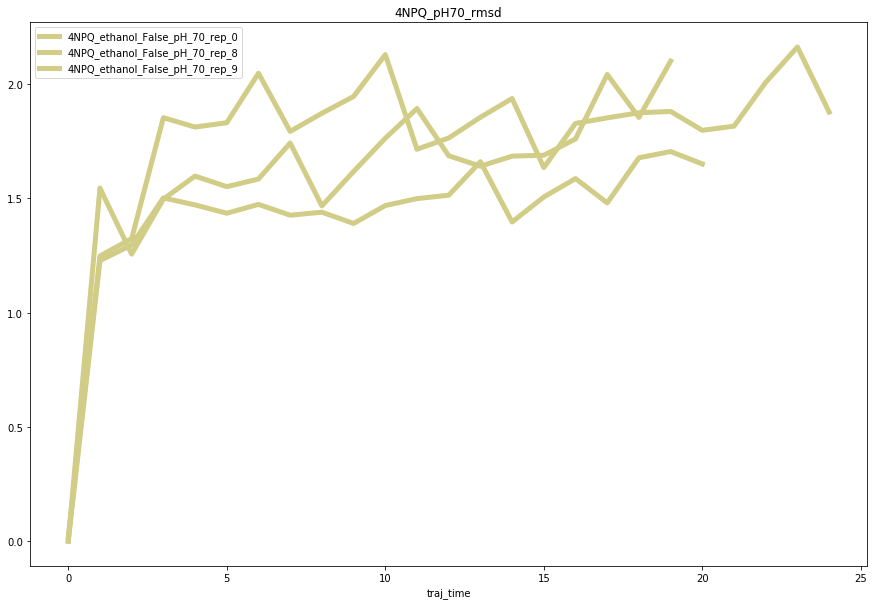

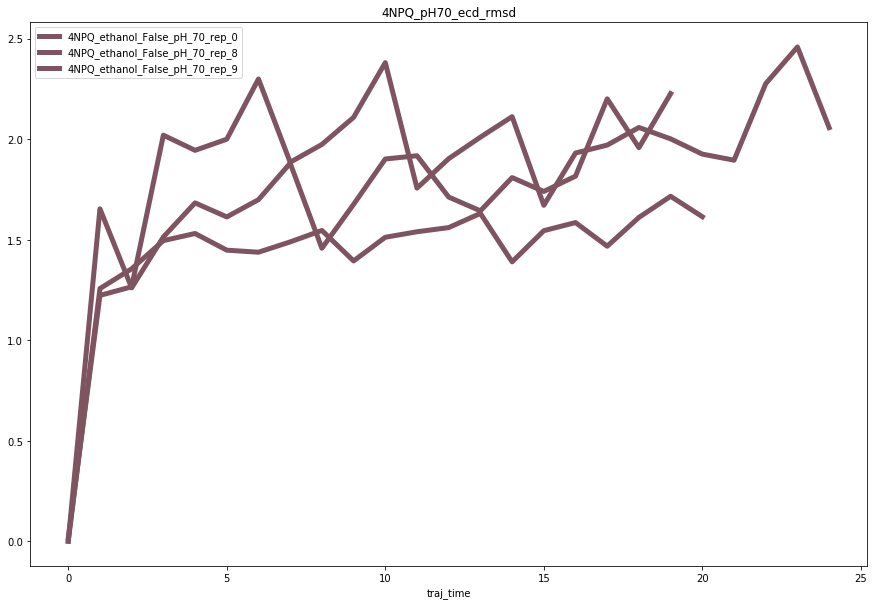

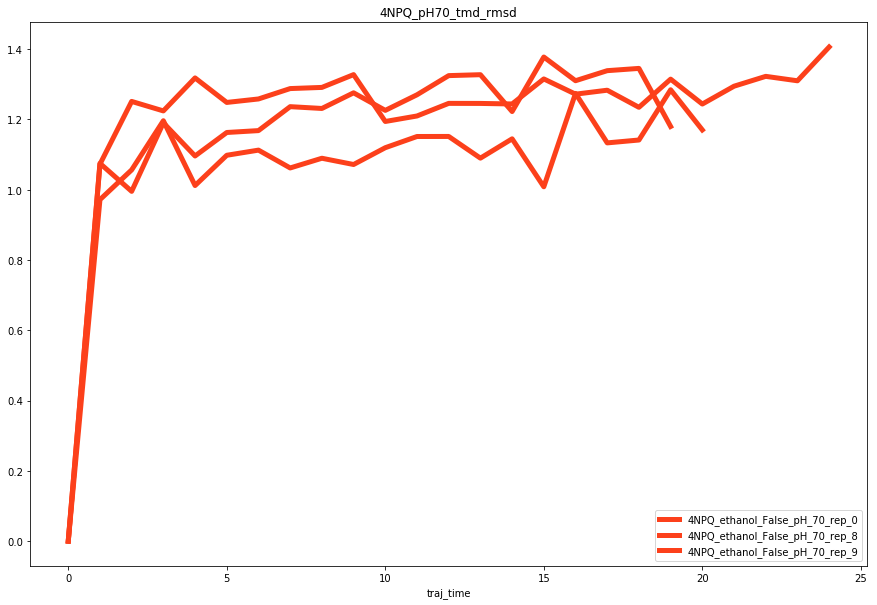

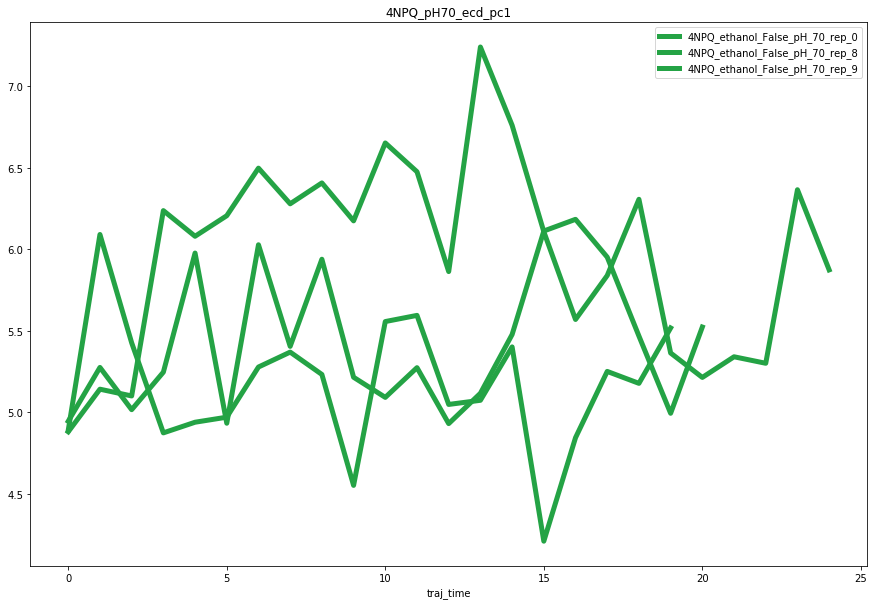

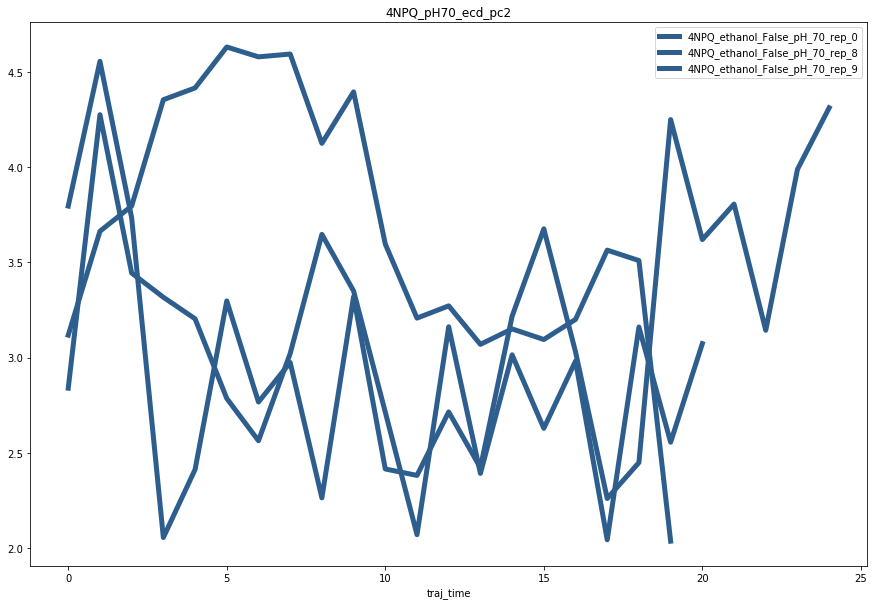

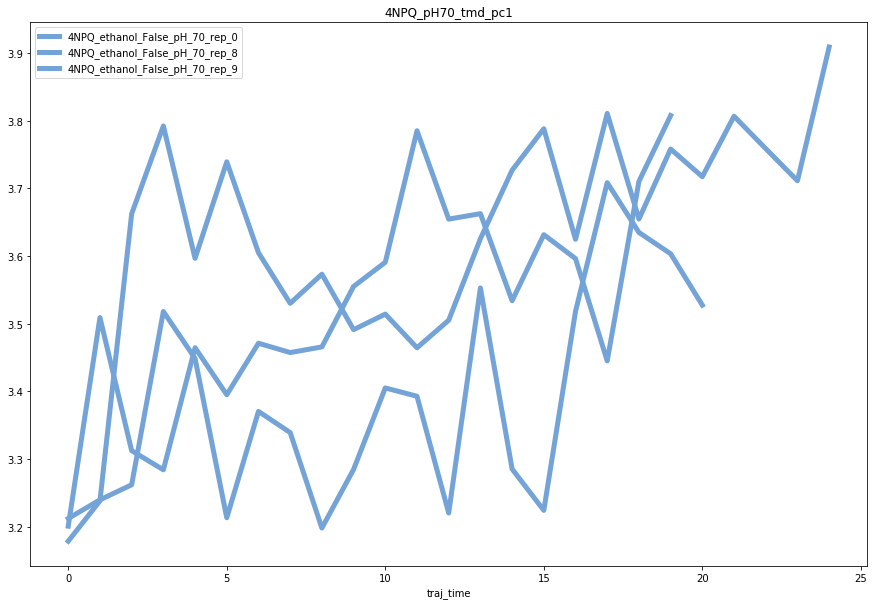

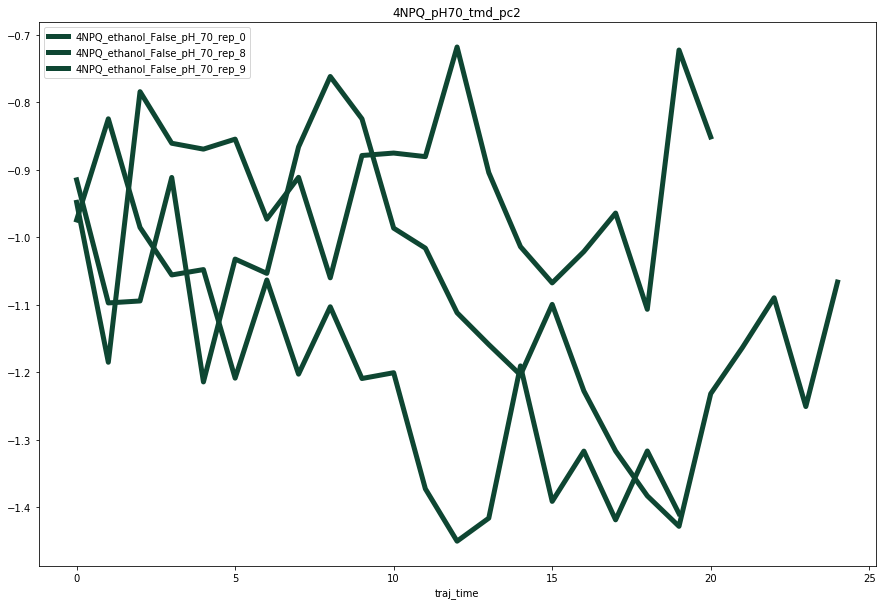

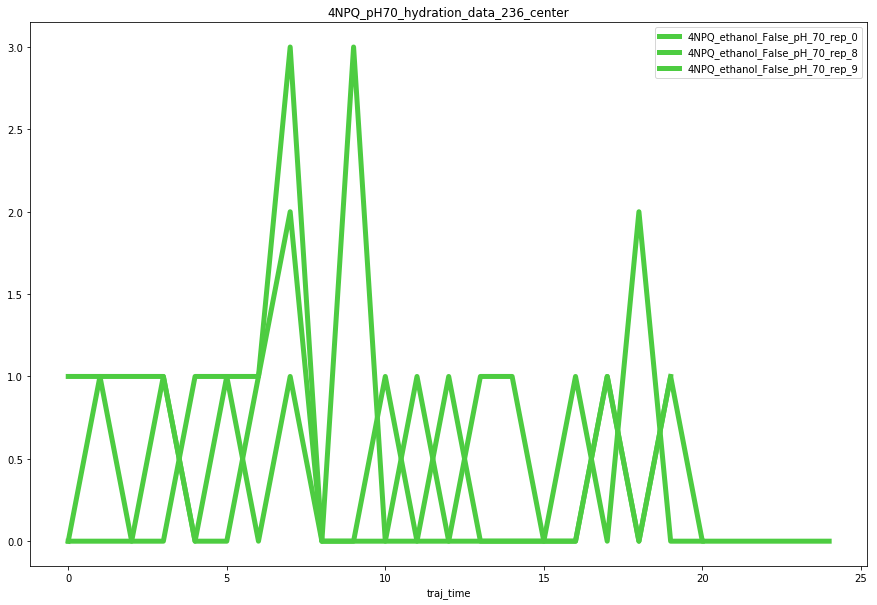

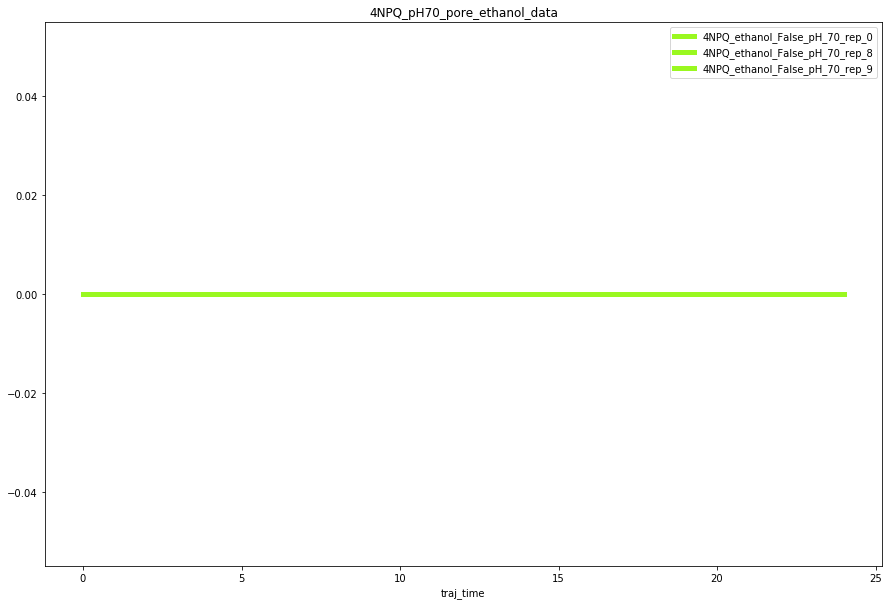

In [34]:
#456 2H #789 1H

traj_notes = [ '4NPQ_pH70_md8','4NPQ_pH70_md9','4NPQ_pH70_md10']
default_location = '/home/scottzhuang/pdc/'
default_skip = 10
plot()

In 4HFI_F238L_pH46_md4, simulation runs 1510 ns.
In 4HFI_F238L_pH46_md5, simulation runs 830 ns.
In 4HFI_F238L_pH46_md6, simulation runs 840 ns.
In 4HFI_F238L_pH46_md7, simulation runs 1020 ns.
In 4HFI_F238L_pH46_md8, simulation runs 1050 ns.
In 4HFI_F238L_pH46_md9, simulation runs 1100 ns.


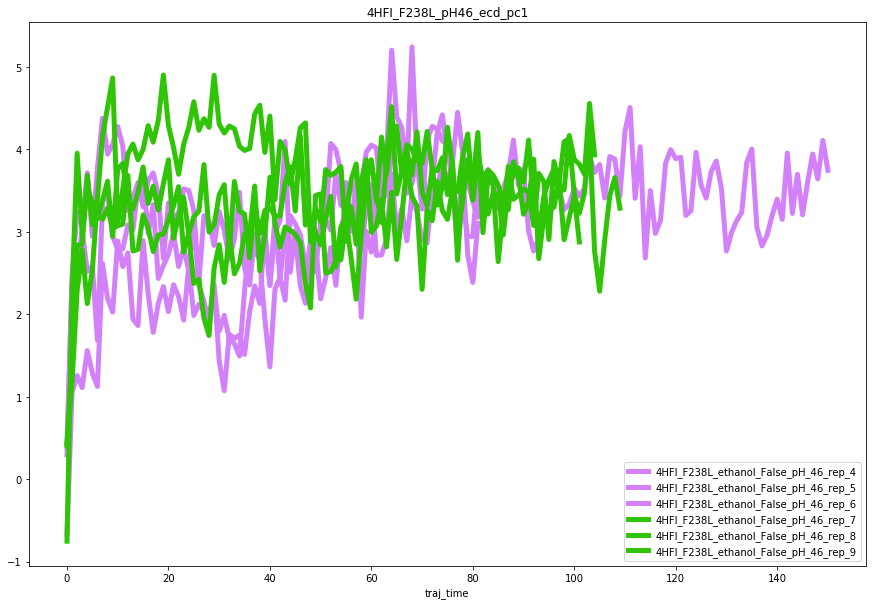

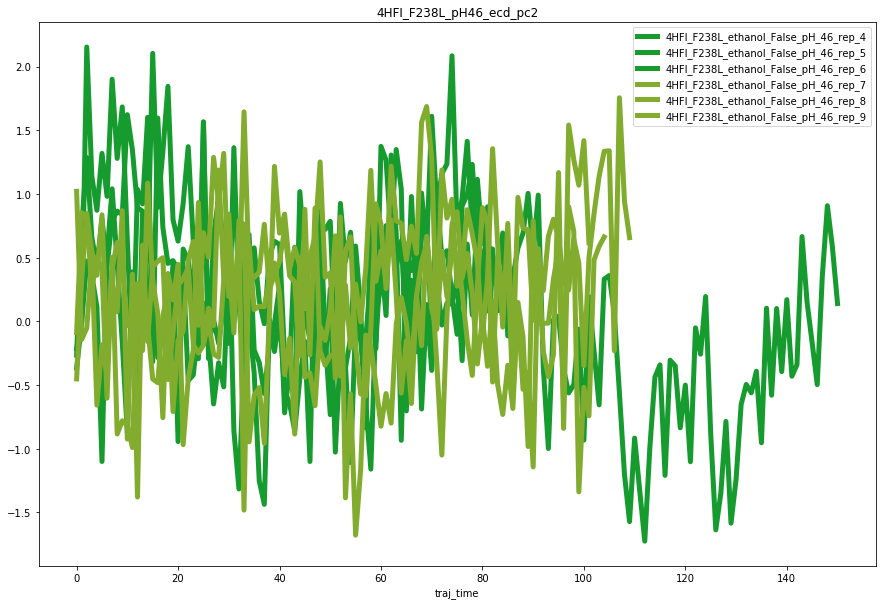

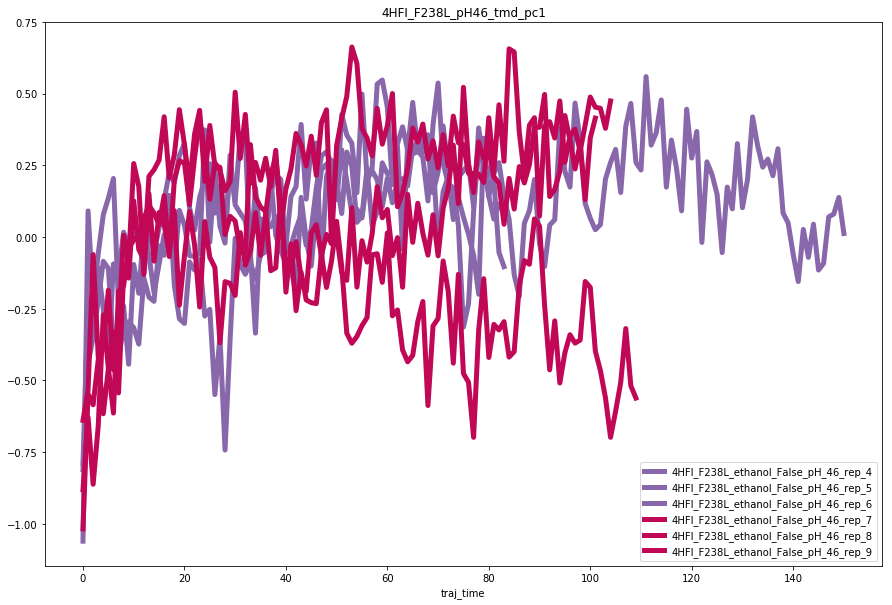

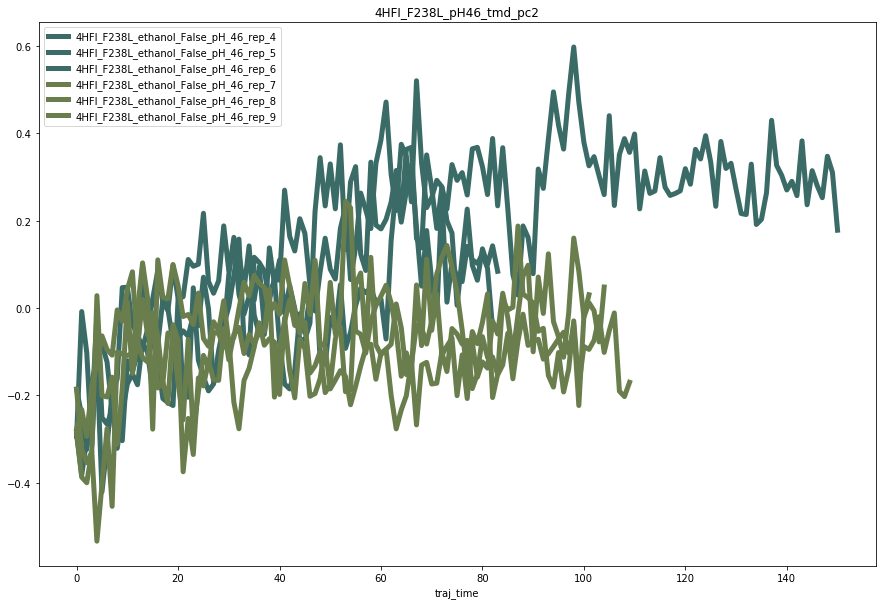

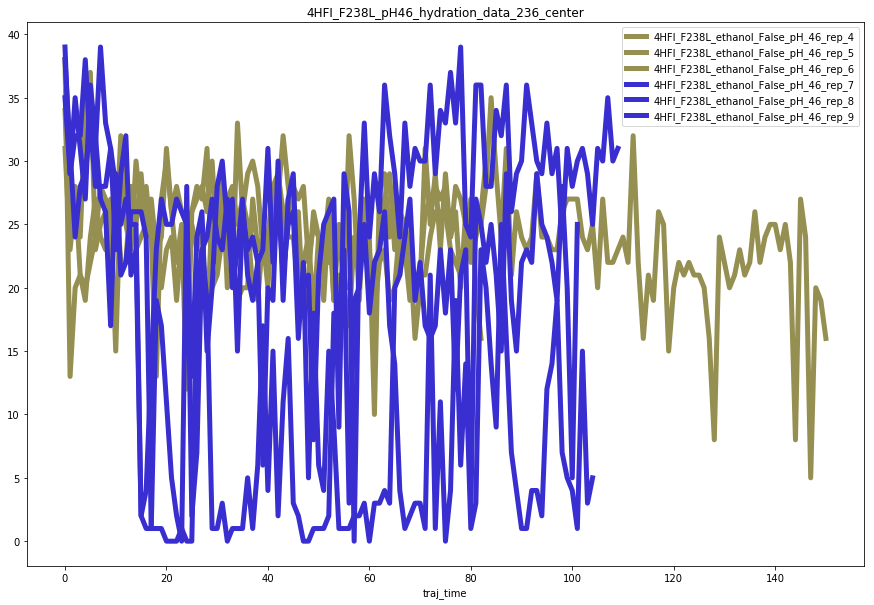

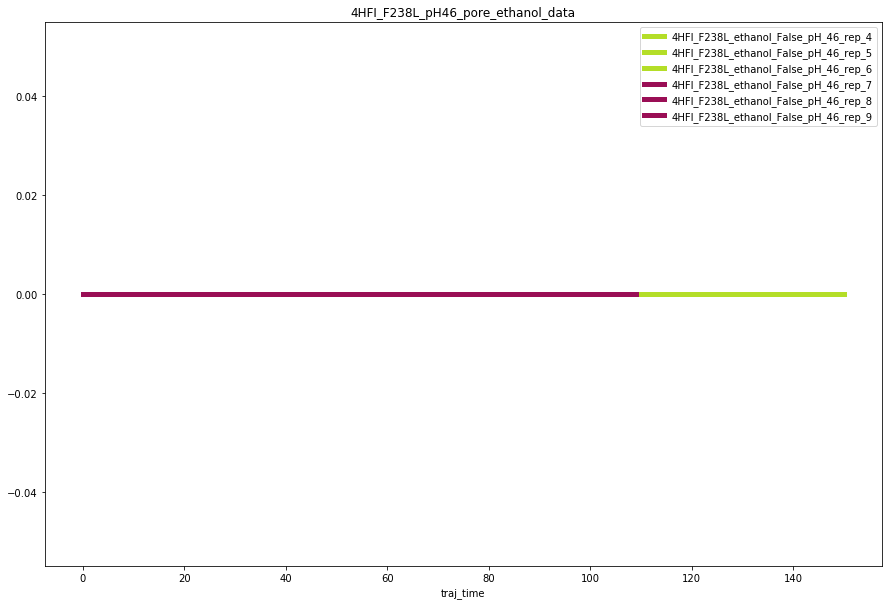

In [103]:
#456 2H #789 1H

traj_notes = [ '4HFI_F238L_pH46_md4','4HFI_F238L_pH46_md5','4HFI_F238L_pH46_md6','4HFI_F238L_pH46_md7','4HFI_F238L_pH46_md8','4HFI_F238L_pH46_md9']
default_location = '/home/scottzhuang/pdc/'
default_skip = 10
plot()

In 4HFI_I233T_pH46_md4, simulation runs 500 ns.
In 4HFI_I233T_pH46_md5, simulation runs 750 ns.
In 4HFI_I233T_pH46_md6, simulation runs 750 ns.
In 4HFI_I233T_pH46_md7, simulation runs 770 ns.
In 4HFI_I233T_pH46_md8, simulation runs 770 ns.
In 4HFI_I233T_pH46_md9, simulation runs 730 ns.


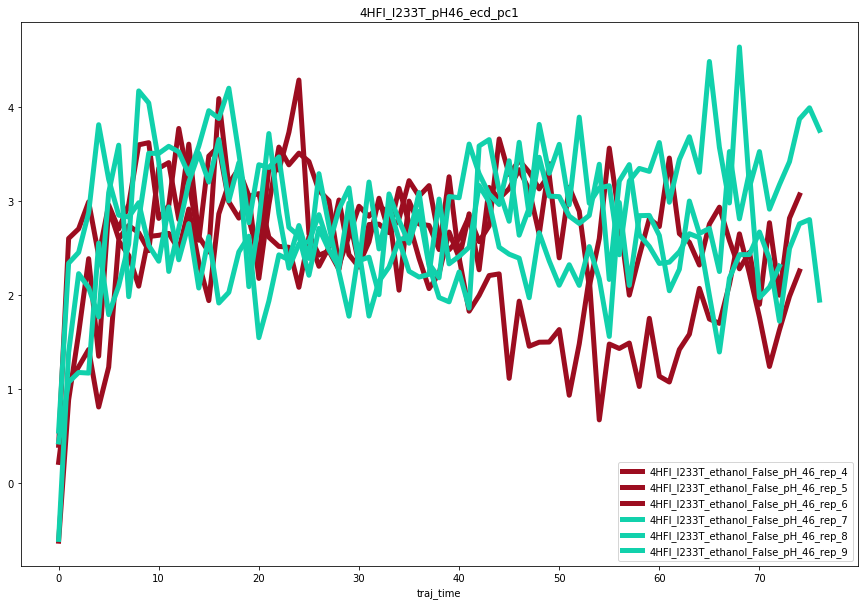

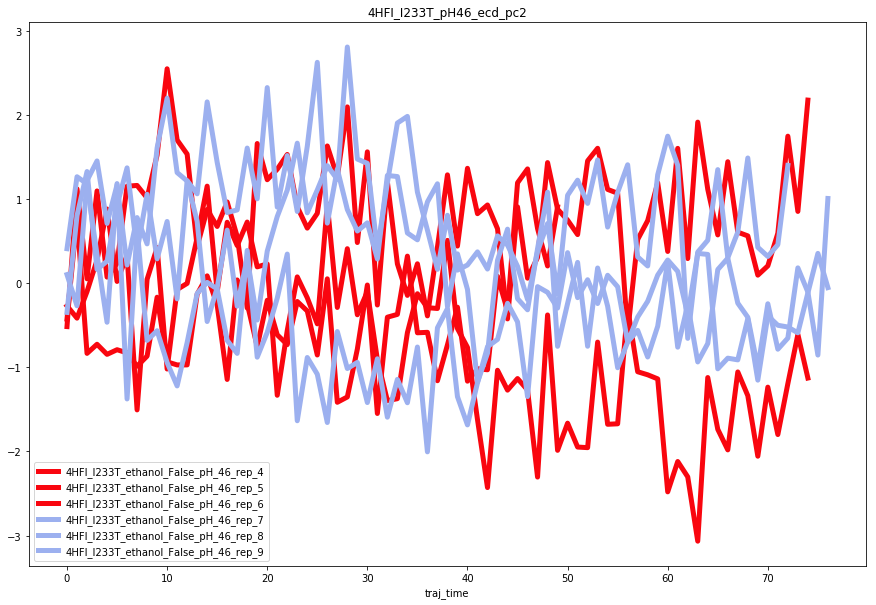

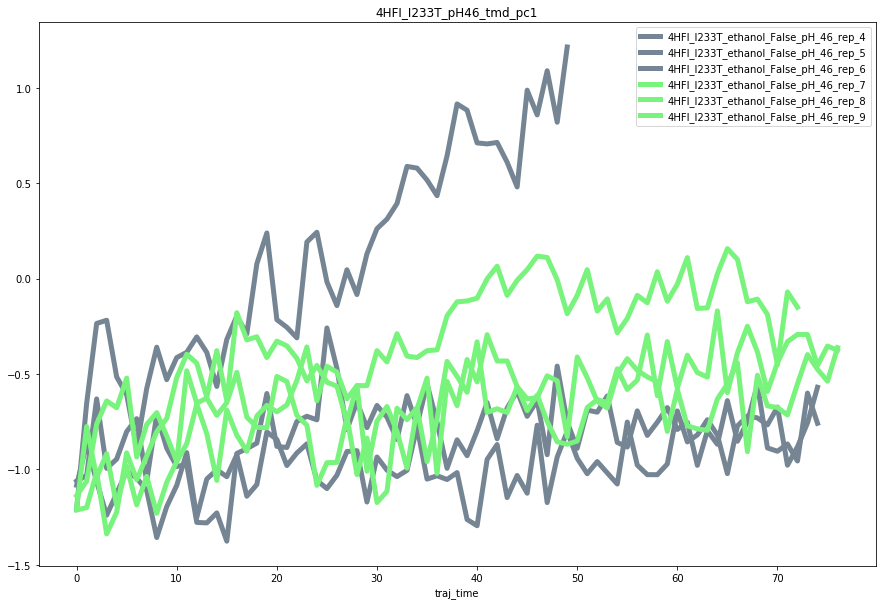

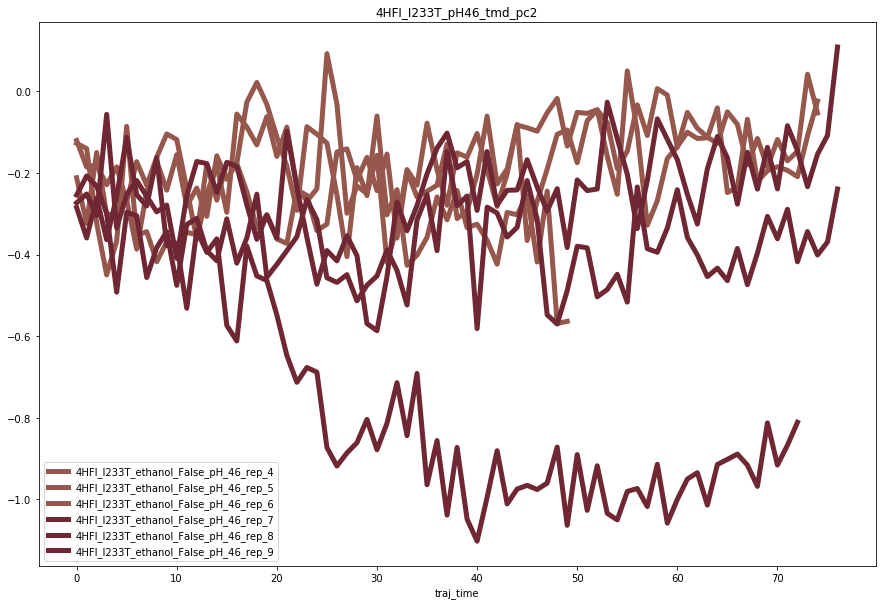

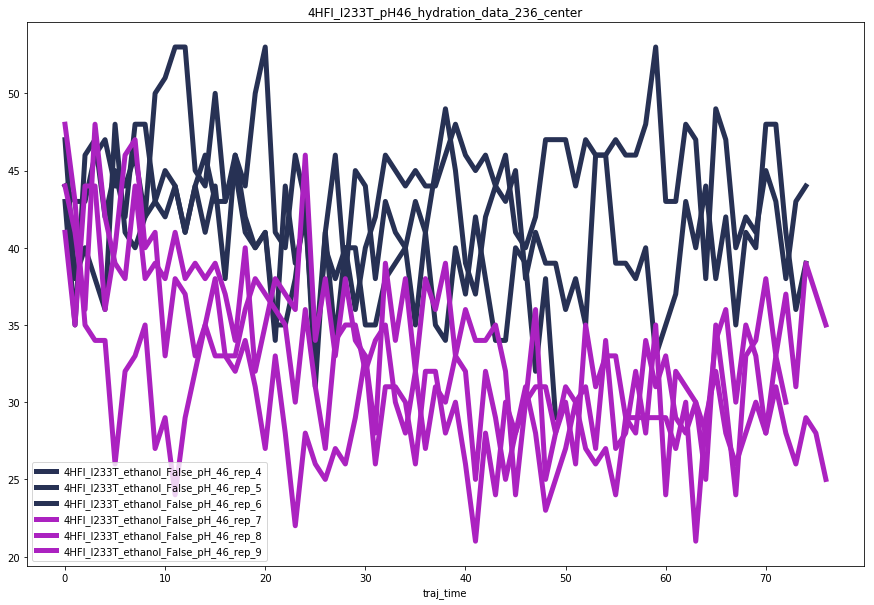

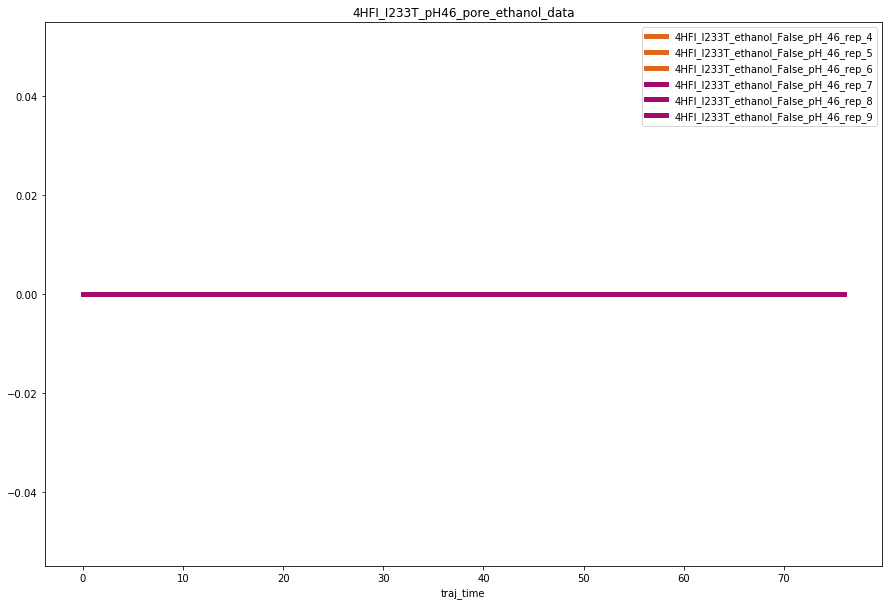

In [104]:
#456 1H #789 2H

traj_notes = [ '4HFI_I233T_pH46_md4','4HFI_I233T_pH46_md5','4HFI_I233T_pH46_md6','4HFI_I233T_pH46_md7','4HFI_I233T_pH46_md8','4HFI_I233T_pH46_md9']
default_location = '/home/scottzhuang/pdc/'
default_skip = 10
plot()

In 4HFI_F238LI233T_pH46_md4, simulation runs 850 ns.
In 4HFI_F238LI233T_pH46_md5, simulation runs 820 ns.
In 4HFI_F238LI233T_pH46_md6, simulation runs 180 ns.
In 4HFI_F238LI233T_pH46_md7, simulation runs 720 ns.
In 4HFI_F238LI233T_pH46_md8, simulation runs 770 ns.
In 4HFI_F238LI233T_pH46_md9, simulation runs 810 ns.


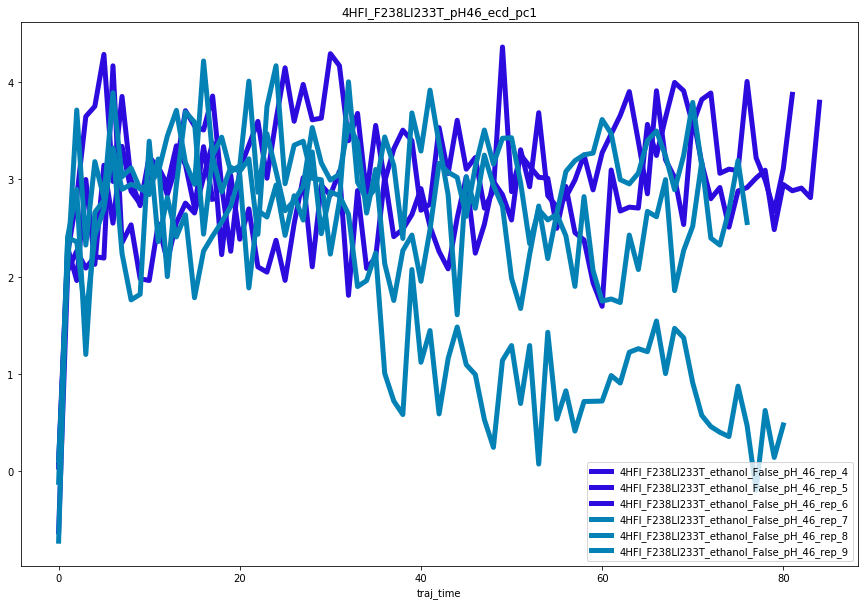

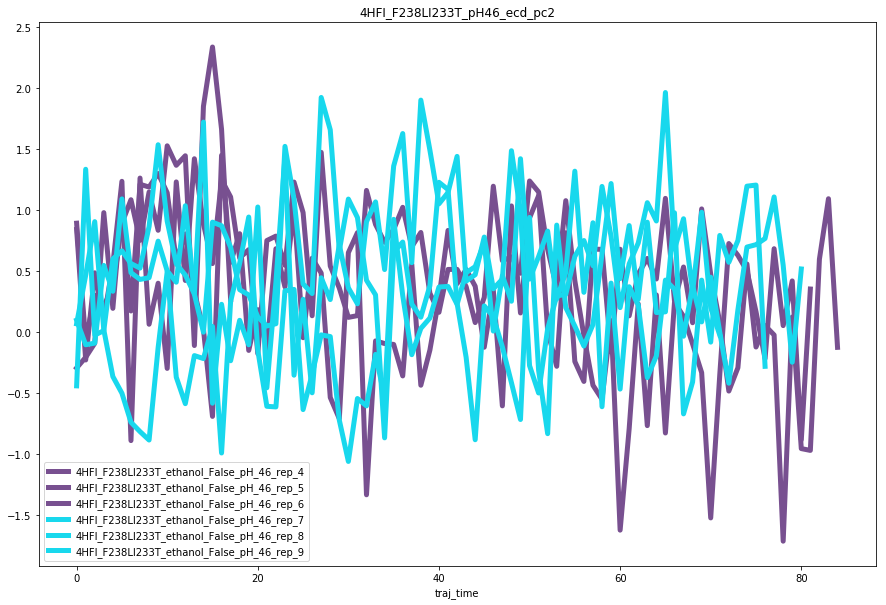

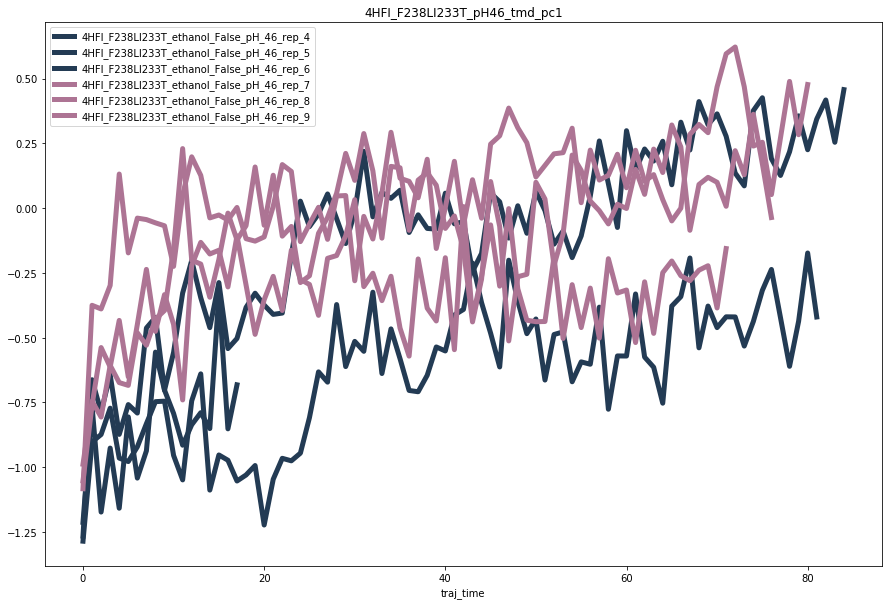

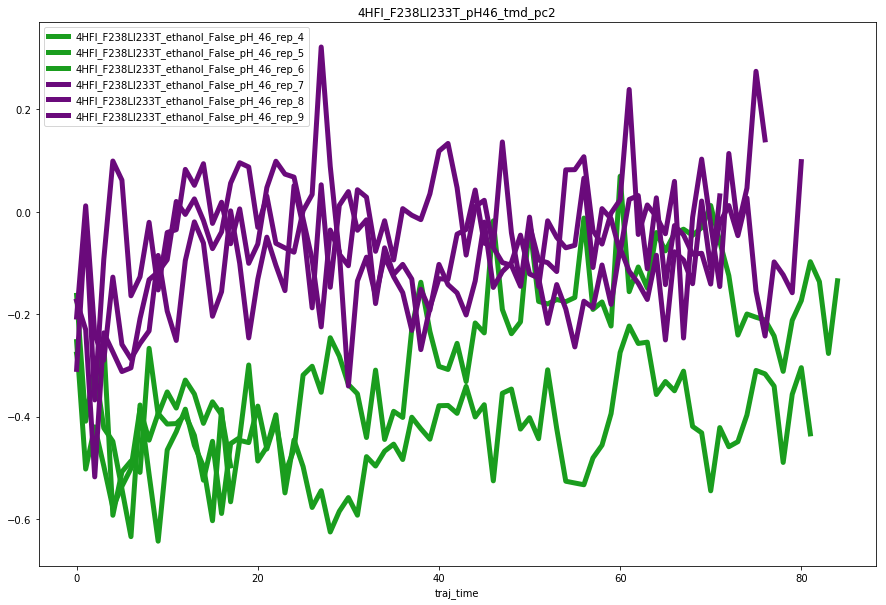

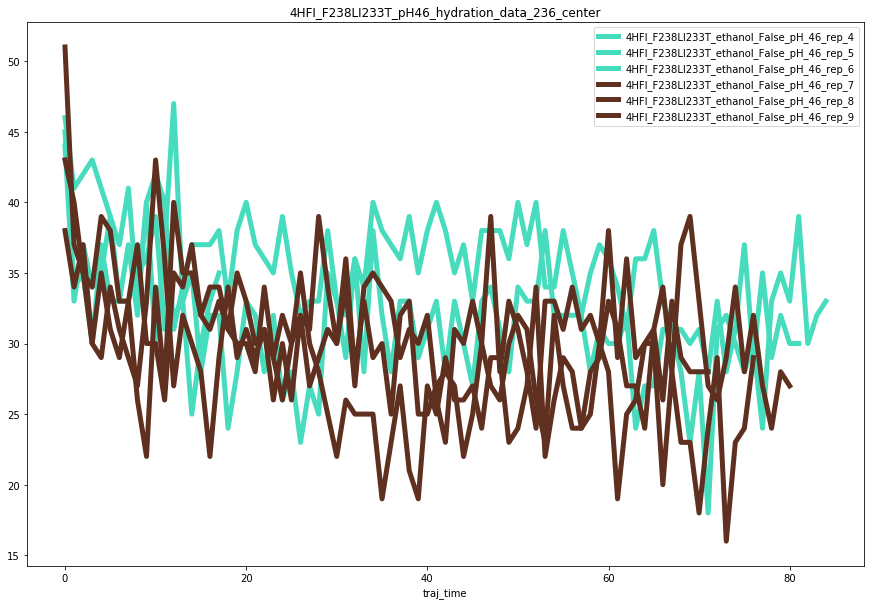

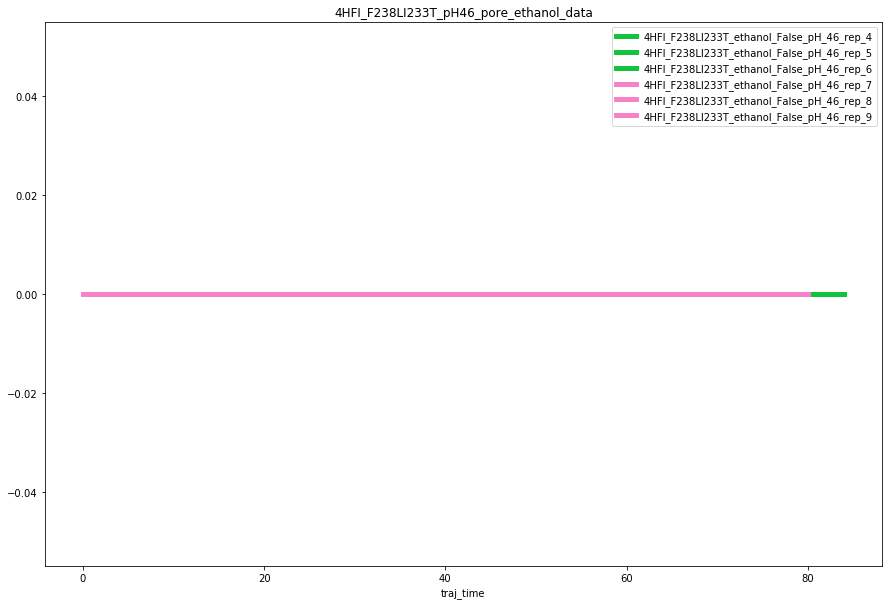

In [105]:
#456 1H #789 2H

traj_notes = [ '4HFI_F238LI233T_pH46_md4','4HFI_F238LI233T_pH46_md5','4HFI_F238LI233T_pH46_md6','4HFI_F238LI233T_pH46_md7','4HFI_F238LI233T_pH46_md8','4HFI_F238LI233T_pH46_md9']
default_location = '/home/scottzhuang/pdc/'
default_skip = 10
plot()

In 4NPQ_pH70_md7, simulation runs 1050 ns.
In 4NPQ_pH70_md5, simulation runs 840 ns.
In 4NPQ_pH70_md6, simulation runs 940 ns.
In 4NPQ_pH70_ethanol_md1, simulation runs 520 ns.
In 4NPQ_pH70_ethanol_md2, simulation runs 680 ns.
In 4NPQ_pH70_ethanol_md3, simulation runs 650 ns.


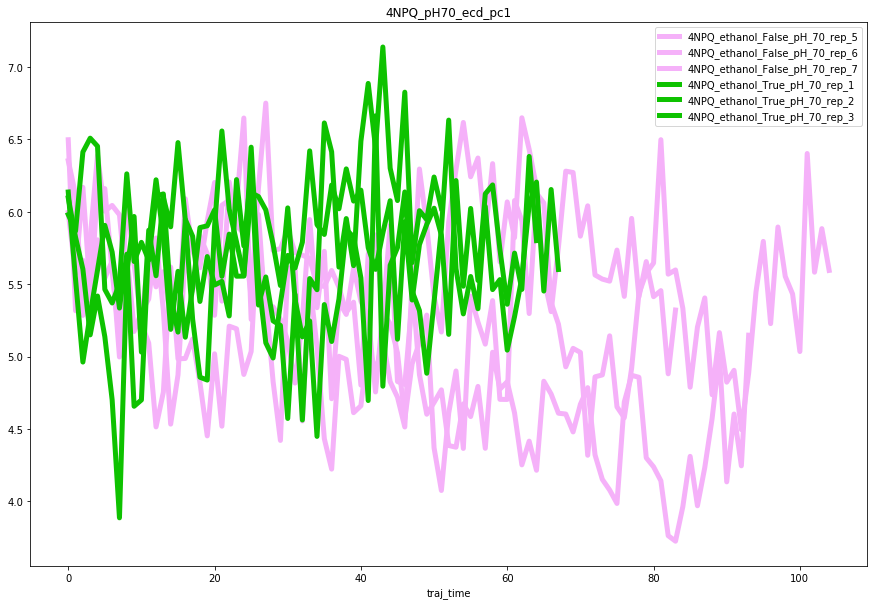

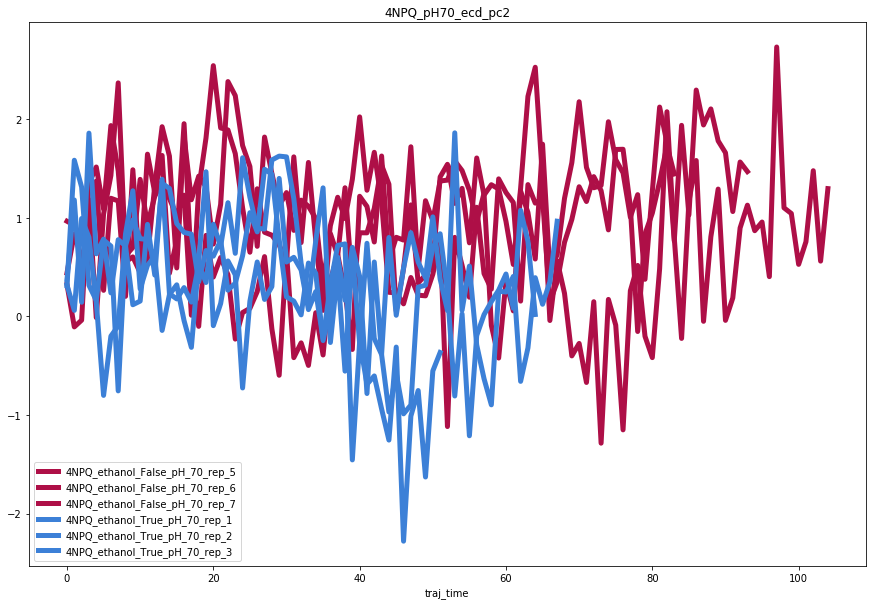

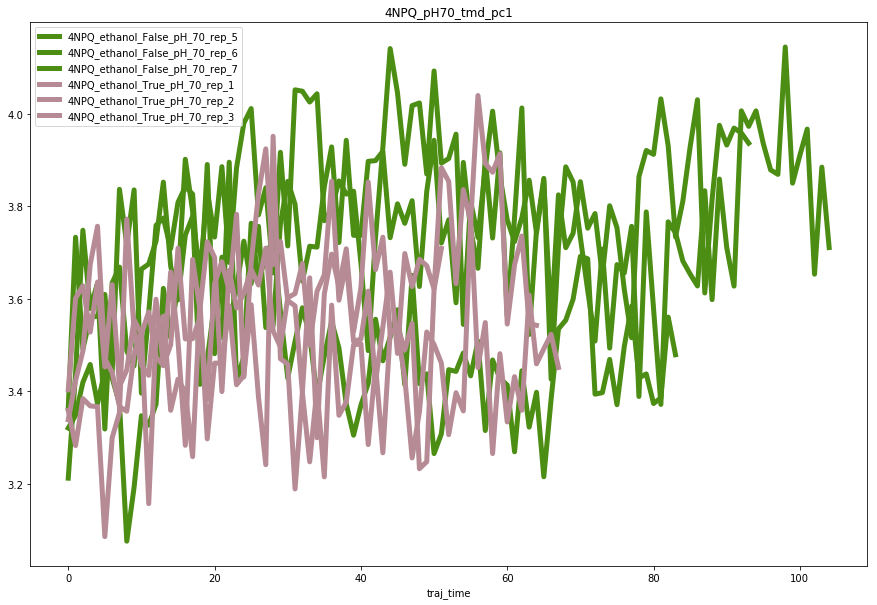

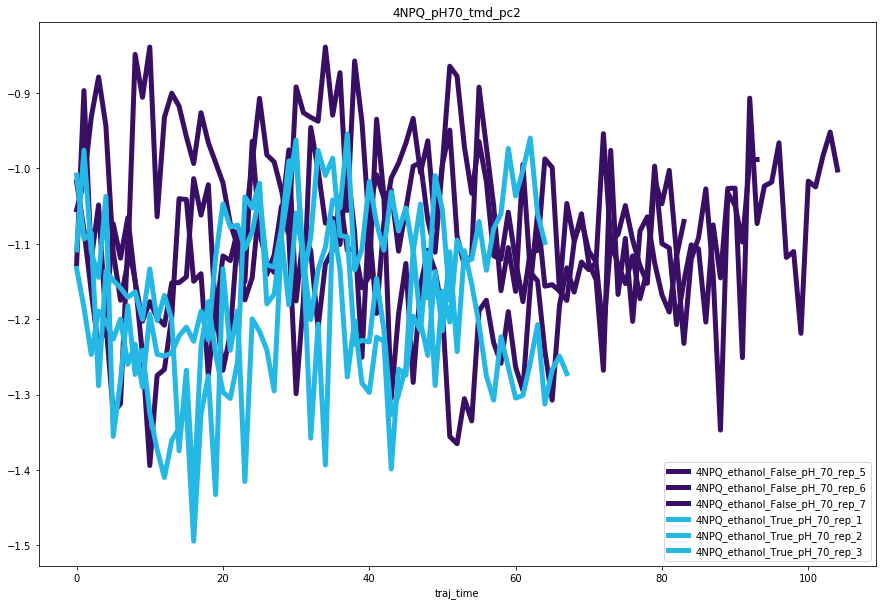

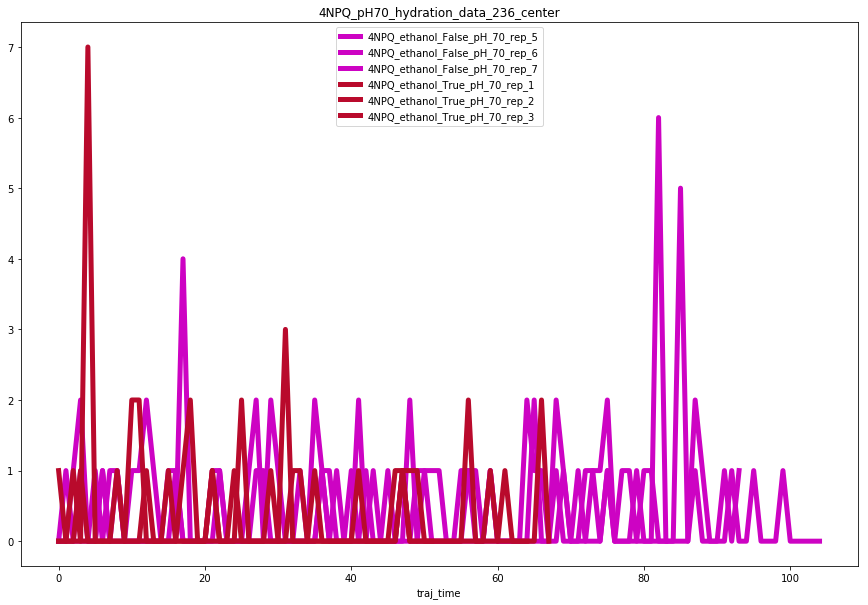

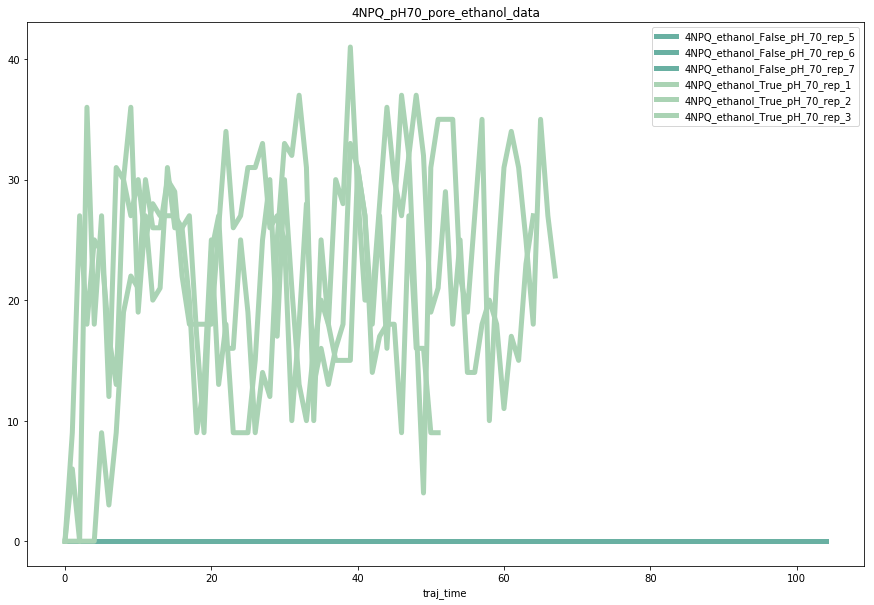

In [50]:
traj_notes = [ '4NPQ_pH70_md7','4NPQ_pH70_md5','4NPQ_pH70_md6','4NPQ_pH70_ethanol_md1','4NPQ_pH70_ethanol_md2','4NPQ_pH70_ethanol_md3']
default_location = '/home/scottzhuang/pdc/'
default_skip = 10
plot()

In 4NPQ_F238L_pH70_md3, simulation runs 830 ns.
In 4NPQ_F238L_pH70_md4, simulation runs 990 ns.
In 4NPQ_F238L_pH70_md5, simulation runs 960 ns.
In 4NPQ_F238L_pH70_ethanol_md1, simulation runs 670 ns.
In 4NPQ_F238L_pH70_ethanol_md2, simulation runs 620 ns.
In 4NPQ_F238L_pH70_ethanol_md3, simulation runs 590 ns.


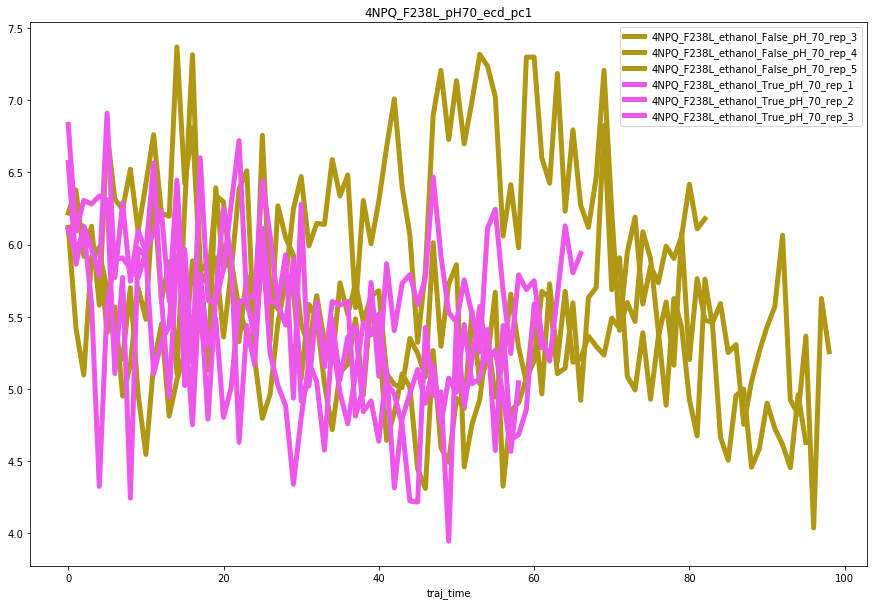

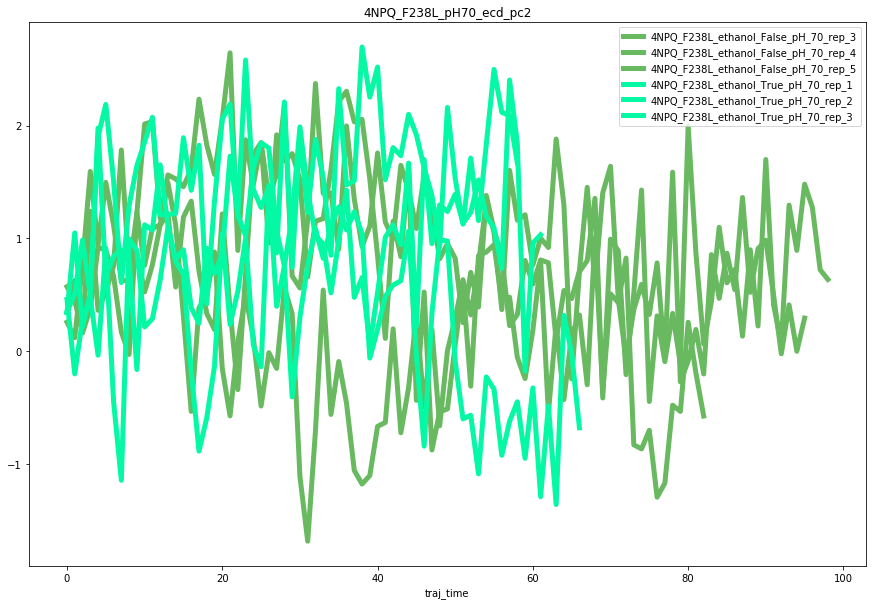

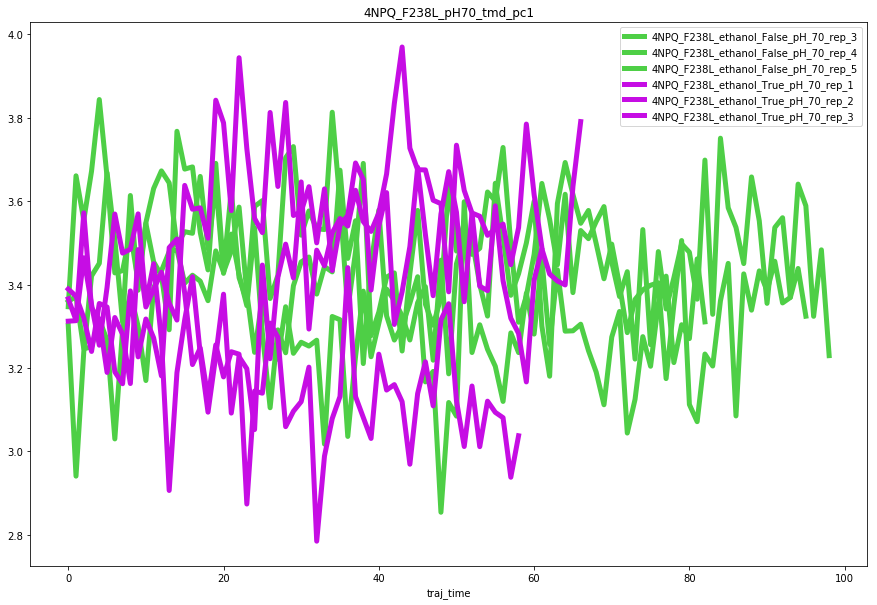

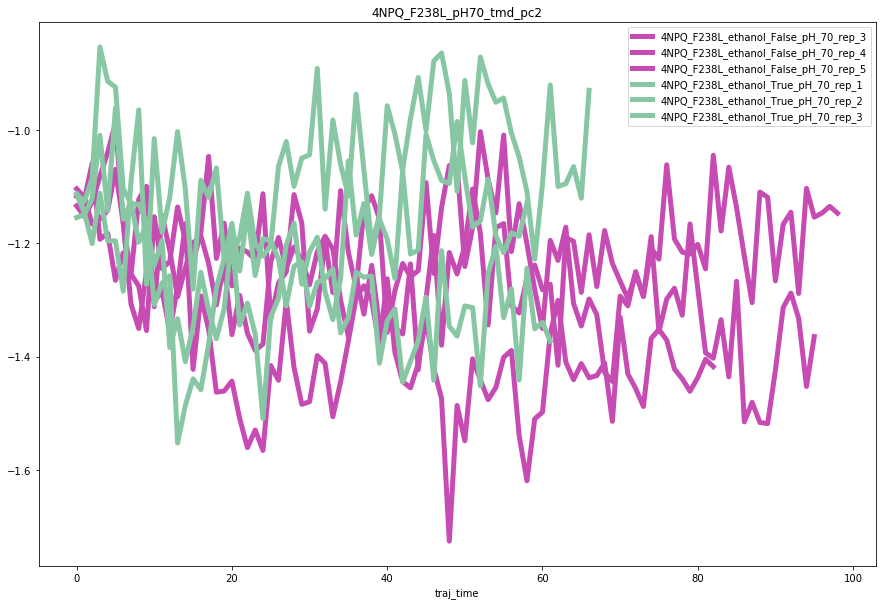

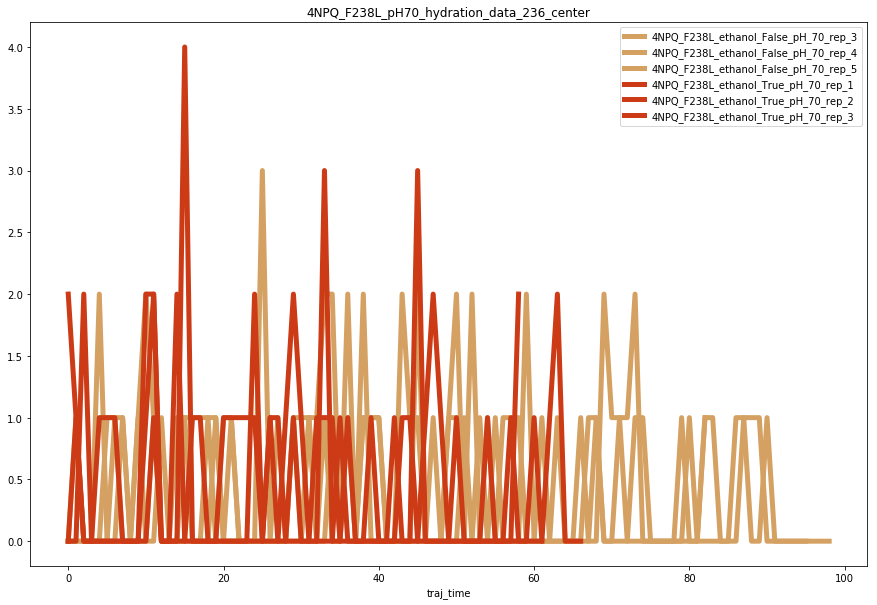

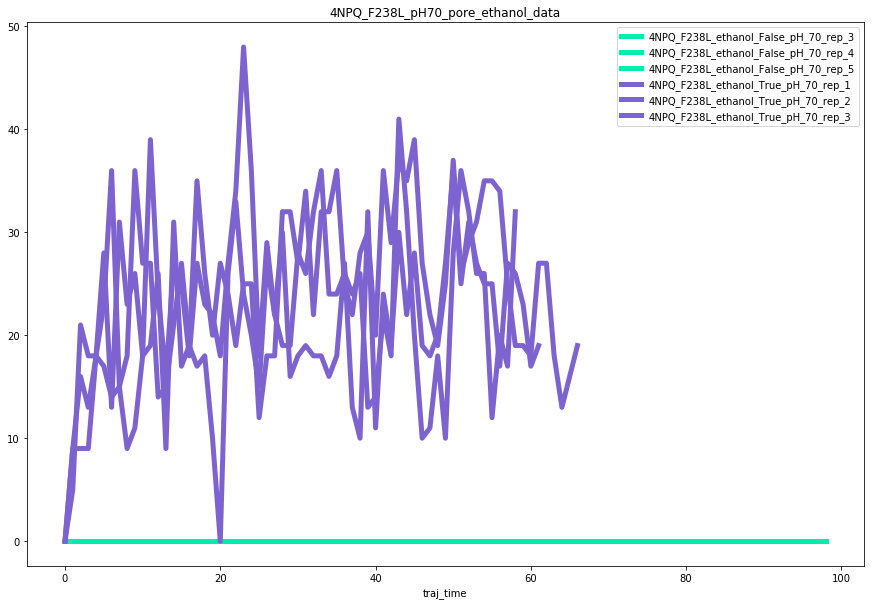

In [46]:
traj_notes = [ '4NPQ_F238L_pH70_md3','4NPQ_F238L_pH70_md4','4NPQ_F238L_pH70_md5','4NPQ_F238L_pH70_ethanol_md1','4NPQ_F238L_pH70_ethanol_md2','4NPQ_F238L_pH70_ethanol_md3']
default_location = '/home/scottzhuang/pdc/'
default_skip = 10
plot()

In 4NPQ_I233T_pH70_md3, simulation runs 890 ns.
In 4NPQ_I233T_pH70_md4, simulation runs 980 ns.
In 4NPQ_I233T_pH70_md5, simulation runs 1050 ns.
In 4NPQ_I233T_pH70_ethanol_md1, simulation runs 660 ns.
In 4NPQ_I233T_pH70_ethanol_md2, simulation runs 630 ns.
In 4NPQ_I233T_pH70_ethanol_md3, simulation runs 640 ns.


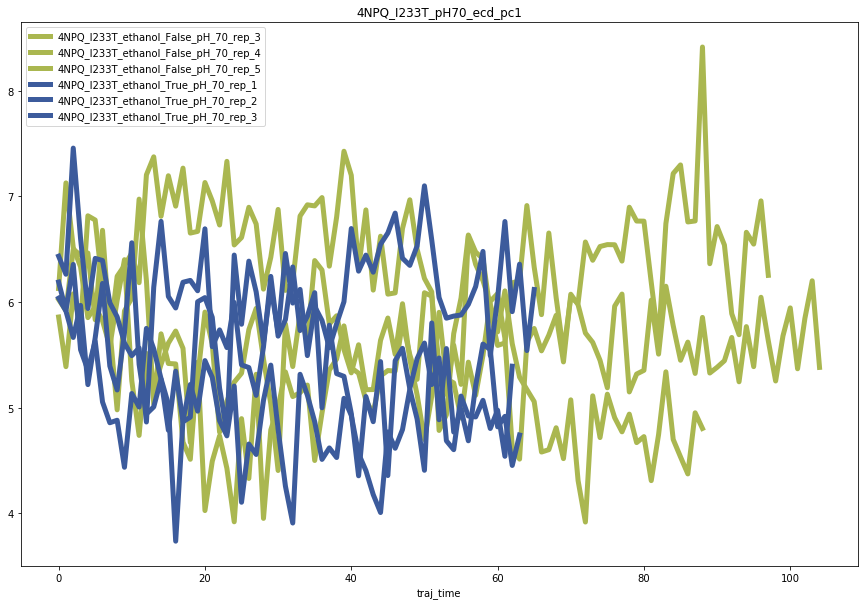

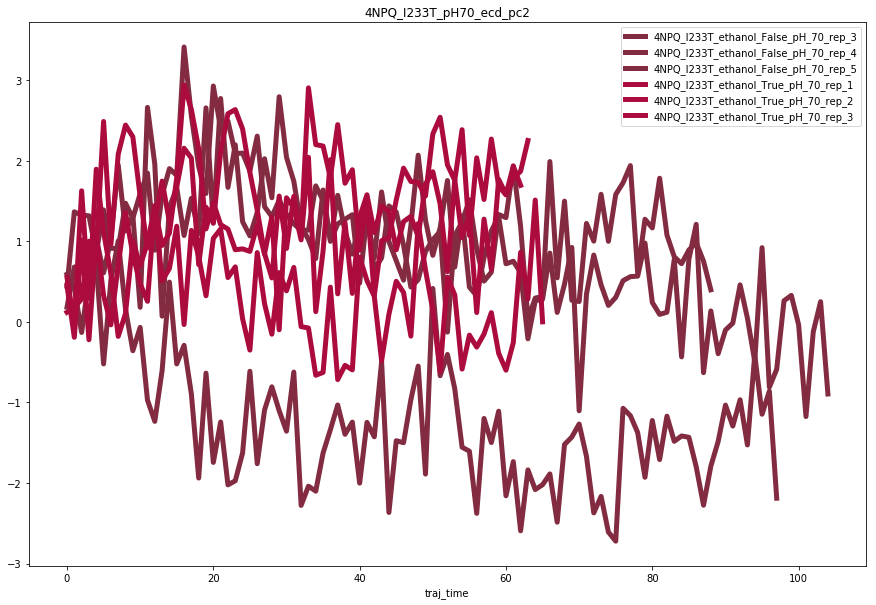

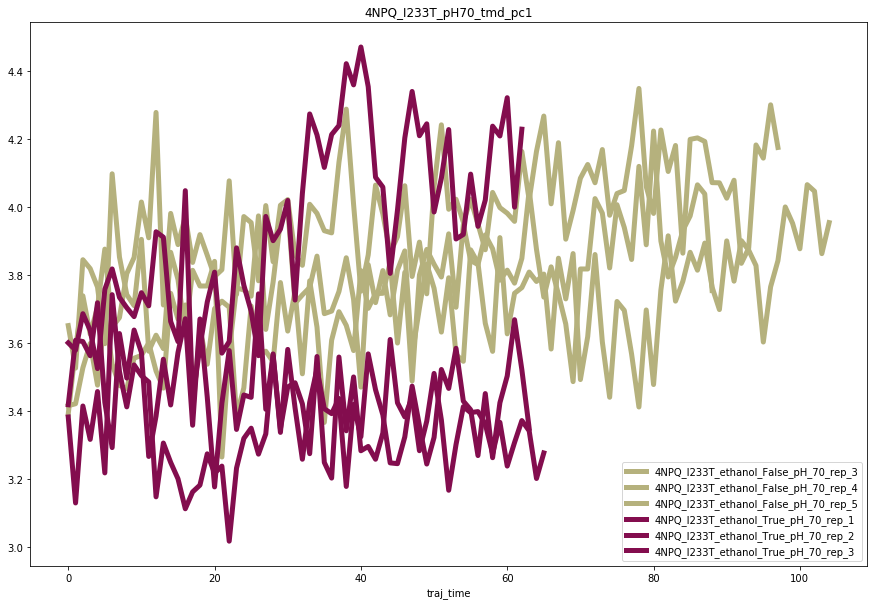

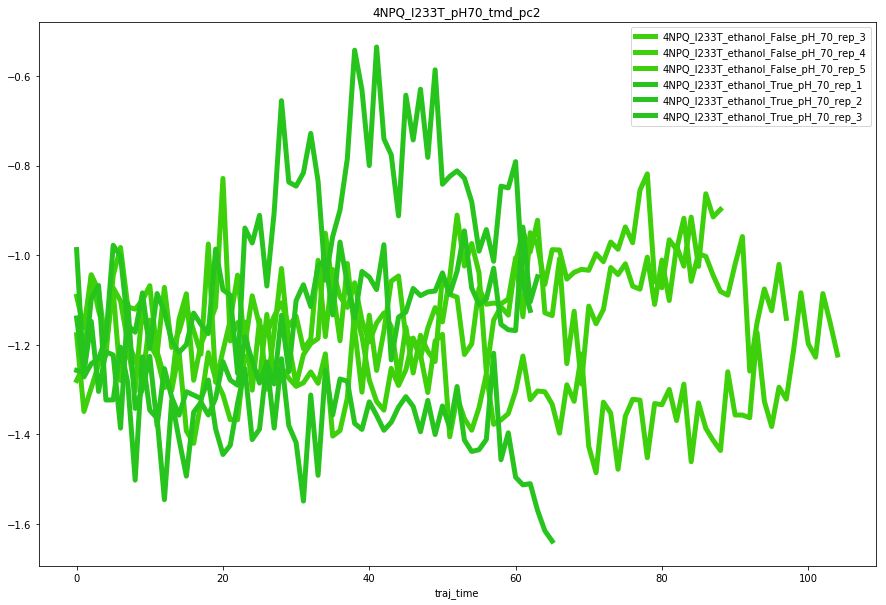

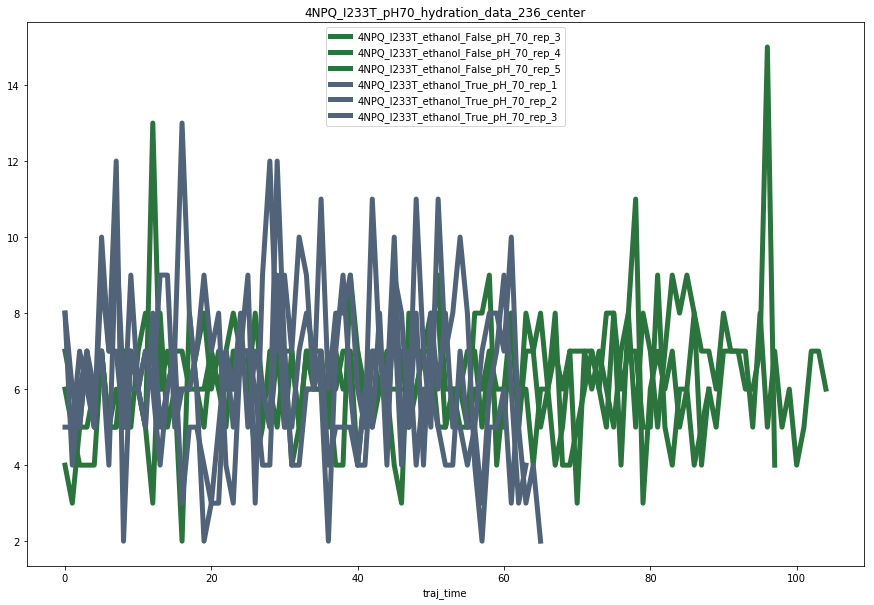

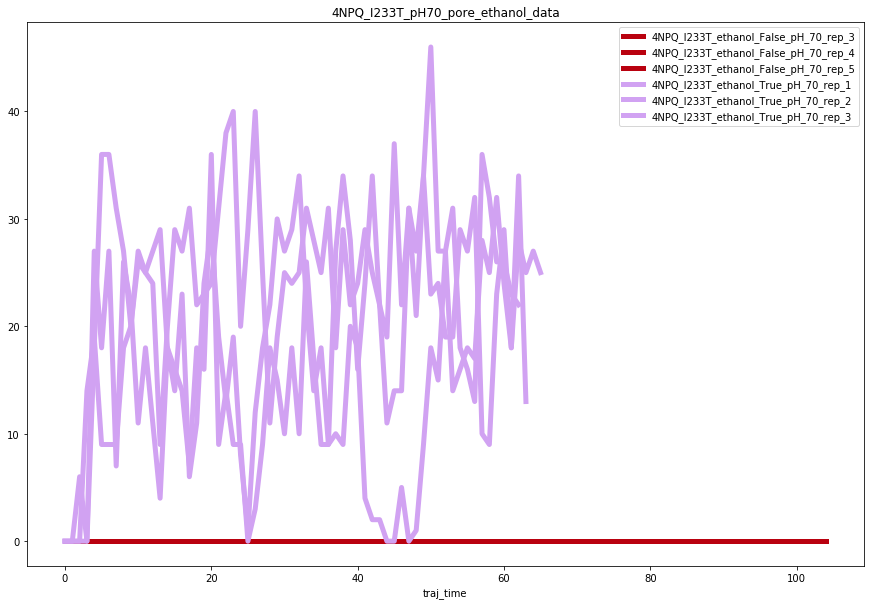

In [51]:
traj_notes = [ '4NPQ_I233T_pH70_md3','4NPQ_I233T_pH70_md4','4NPQ_I233T_pH70_md5','4NPQ_I233T_pH70_ethanol_md1','4NPQ_I233T_pH70_ethanol_md2','4NPQ_I233T_pH70_ethanol_md3']
default_location = '/home/scottzhuang/pdc/'
default_skip = 10
plot()

In 4NPQ_F238LI233T_pH70_md3, simulation runs 880 ns.
In 4NPQ_F238LI233T_pH70_md4, simulation runs 920 ns.
In 4NPQ_F238LI233T_pH70_md5, simulation runs 1010 ns.
In 4NPQ_F238LI233T_pH70_ethanol_md1, simulation runs 630 ns.
In 4NPQ_F238LI233T_pH70_ethanol_md2, simulation runs 640 ns.
In 4NPQ_F238LI233T_pH70_ethanol_md3, simulation runs 640 ns.


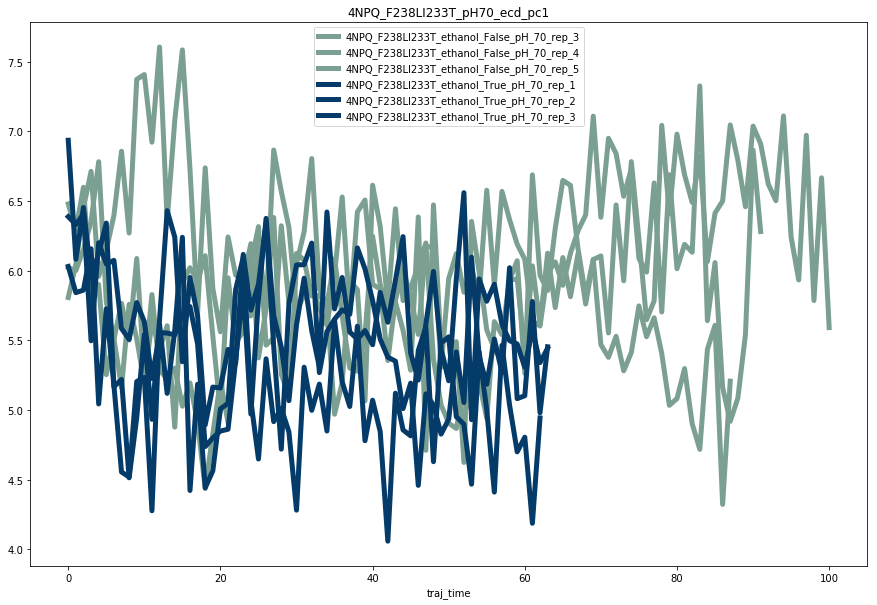

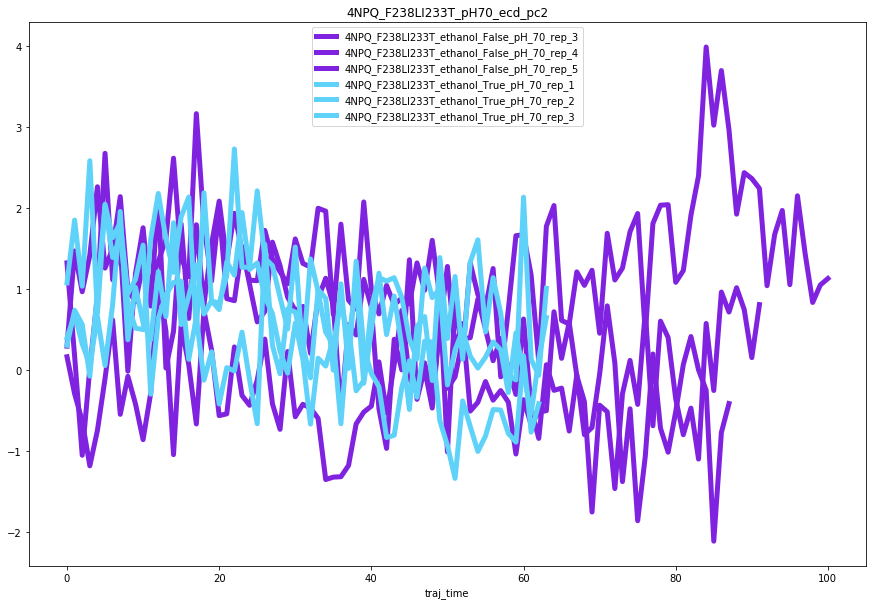

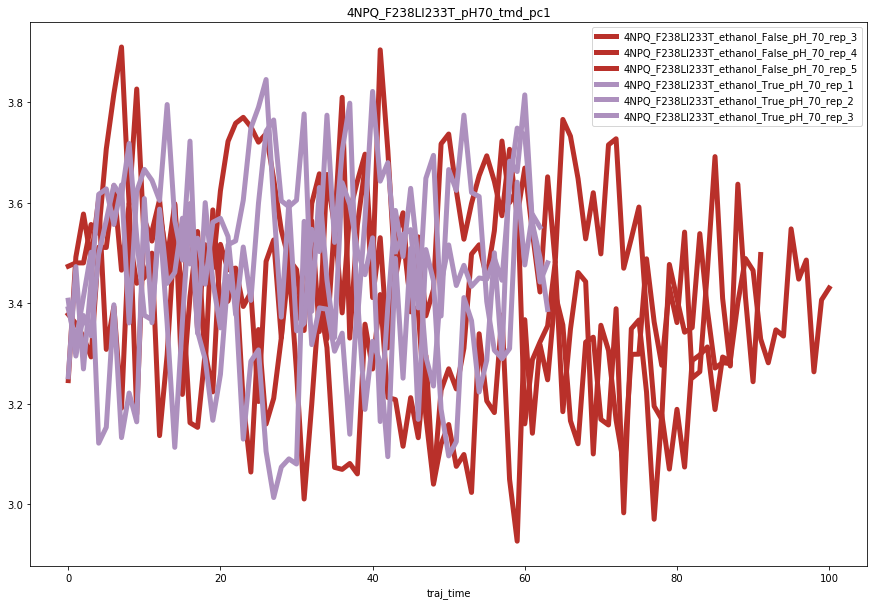

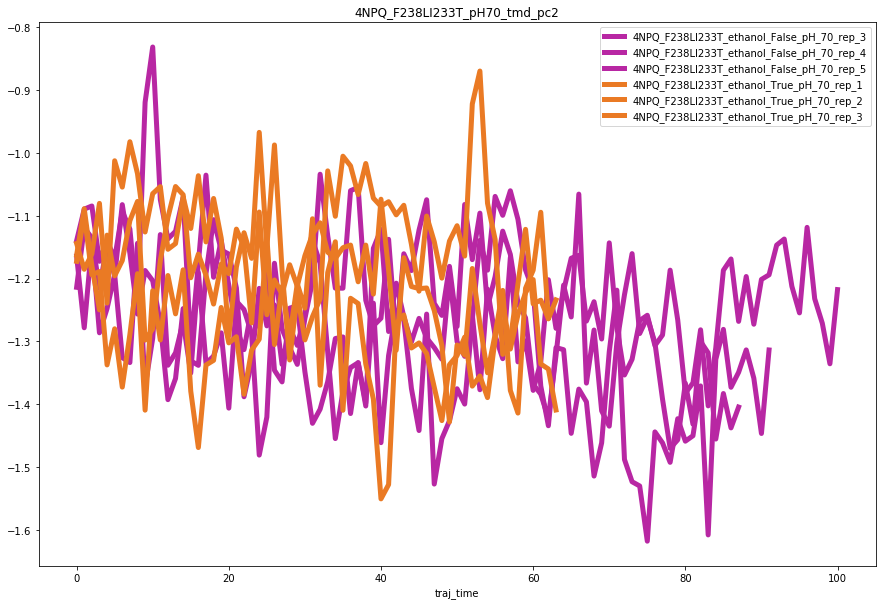

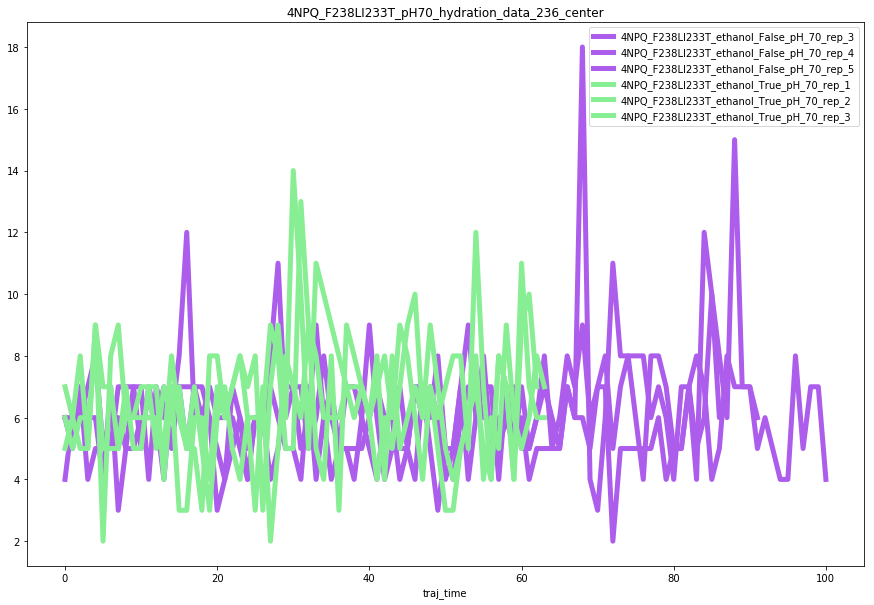

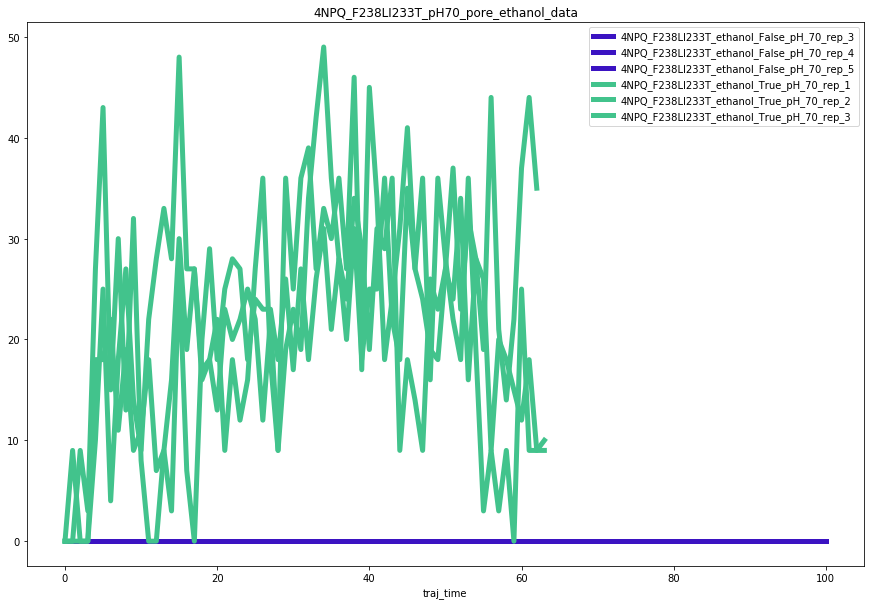

In [52]:
traj_notes = [ '4NPQ_F238LI233T_pH70_md3','4NPQ_F238LI233T_pH70_md4','4NPQ_F238LI233T_pH70_md5','4NPQ_F238LI233T_pH70_ethanol_md1','4NPQ_F238LI233T_pH70_ethanol_md2','4NPQ_F238LI233T_pH70_ethanol_md3']
default_location = '/home/scottzhuang/pdc/'
default_skip = 10
plot()

In 4HFI_pH46_md4, simulation runs 1160 ns.
In 4HFI_pH46_md5, simulation runs 1020 ns.
In 4HFI_pH46_md6, simulation runs 1110 ns.
In 4HFI_pH46_ethanol_md1, simulation runs 850 ns.
In 4HFI_pH46_ethanol_md2, simulation runs 560 ns.
In 4HFI_pH46_ethanol_md3, simulation runs 600 ns.


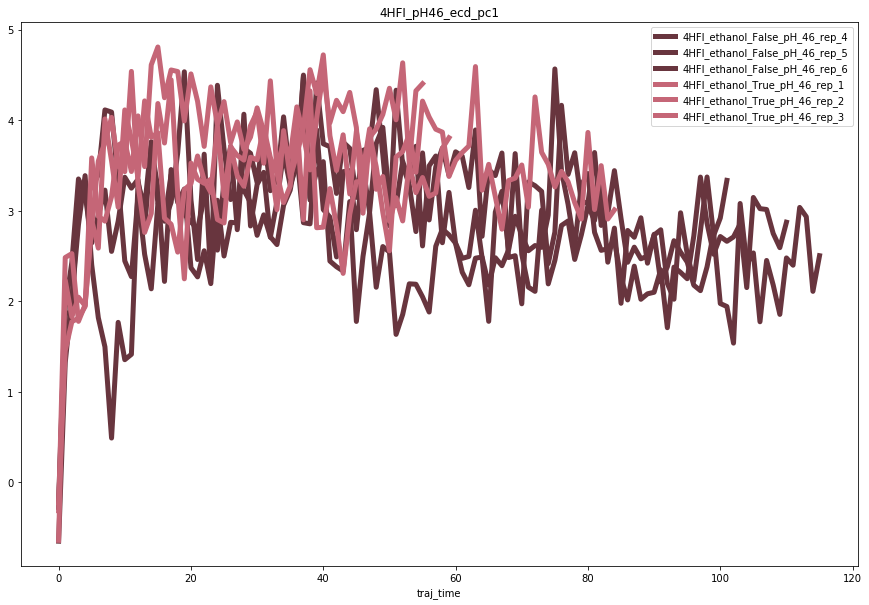

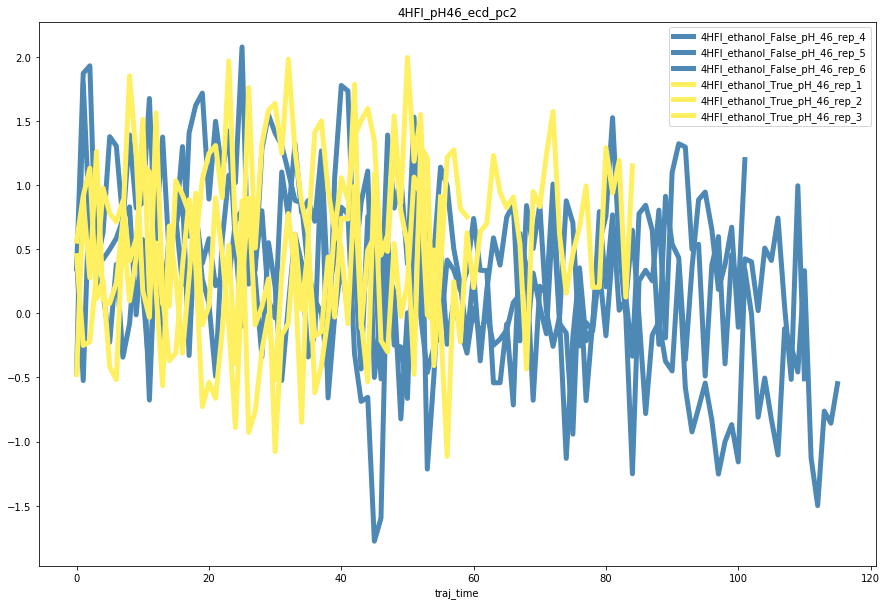

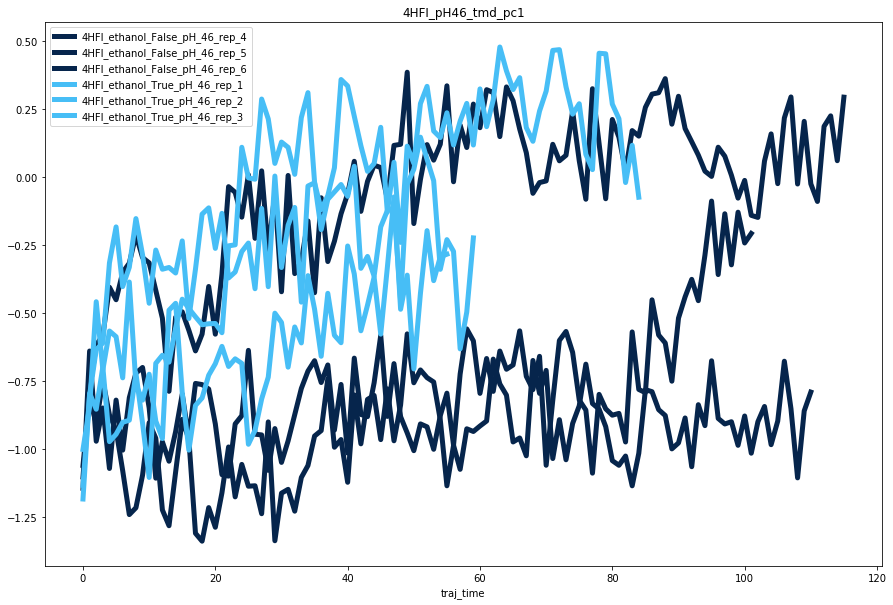

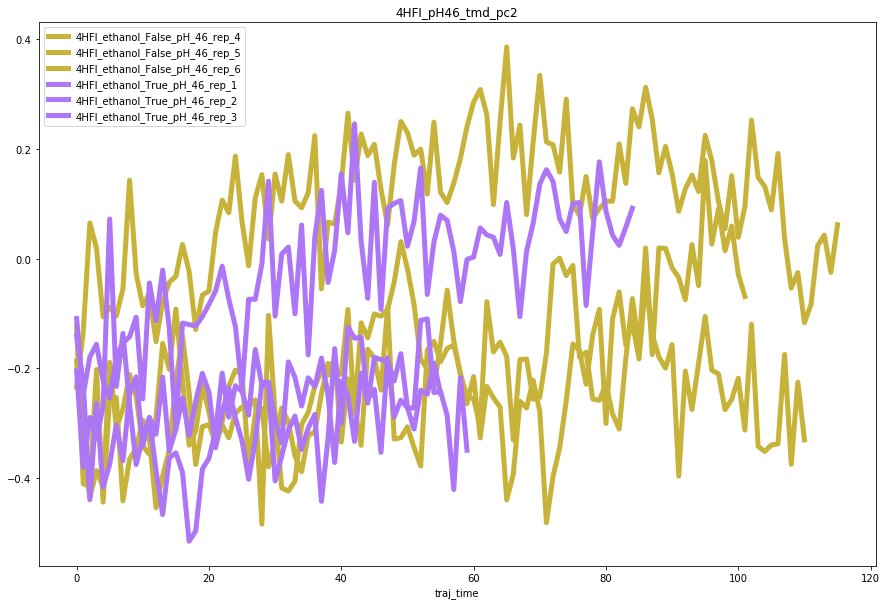

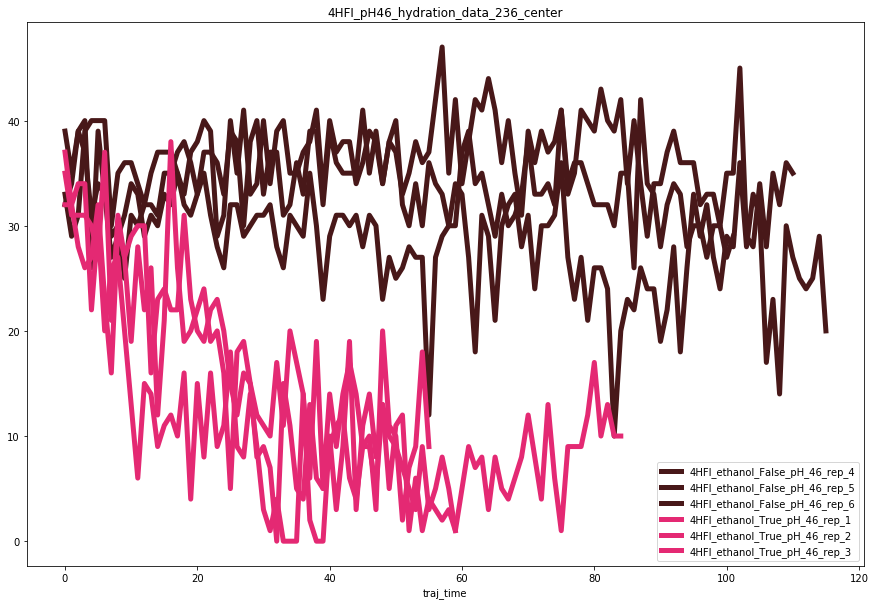

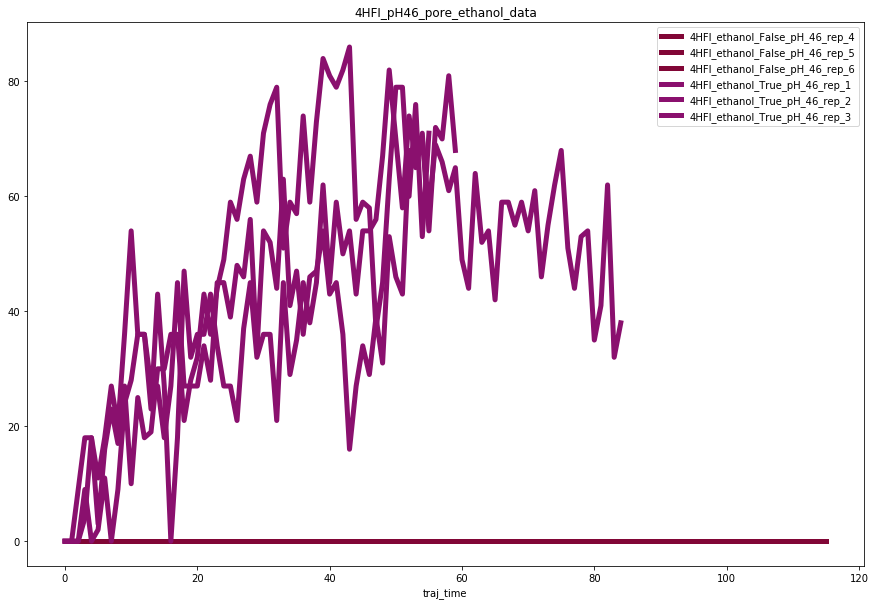

In [49]:
#1H

traj_notes = [ '4HFI_pH46_md4','4HFI_pH46_md5','4HFI_pH46_md6','4HFI_pH46_ethanol_md1','4HFI_pH46_ethanol_md2','4HFI_pH46_ethanol_md3']
default_location = '/home/scottzhuang/pdc/'
default_skip = 10
plot()

In 4HFI_F238L_pH46_md4, simulation runs 1510 ns.
In 4HFI_F238L_pH46_md5, simulation runs 1100 ns.
In 4HFI_F238L_pH46_md6, simulation runs 1130 ns.
In 4HFI_F238L_pH46_ethanol_md4, simulation runs 550 ns.
In 4HFI_F238L_pH46_ethanol_md5, simulation runs 580 ns.
In 4HFI_F238L_pH46_ethanol_md6, simulation runs 590 ns.


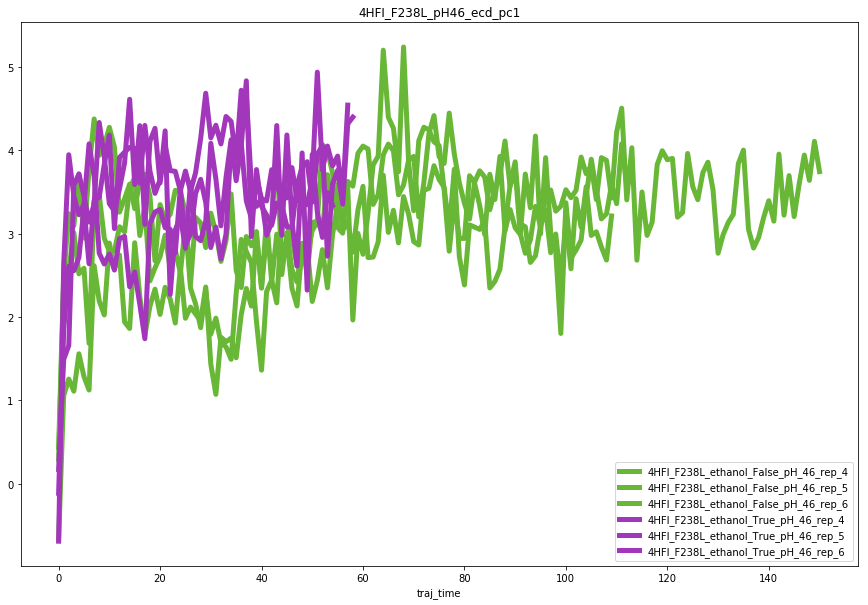

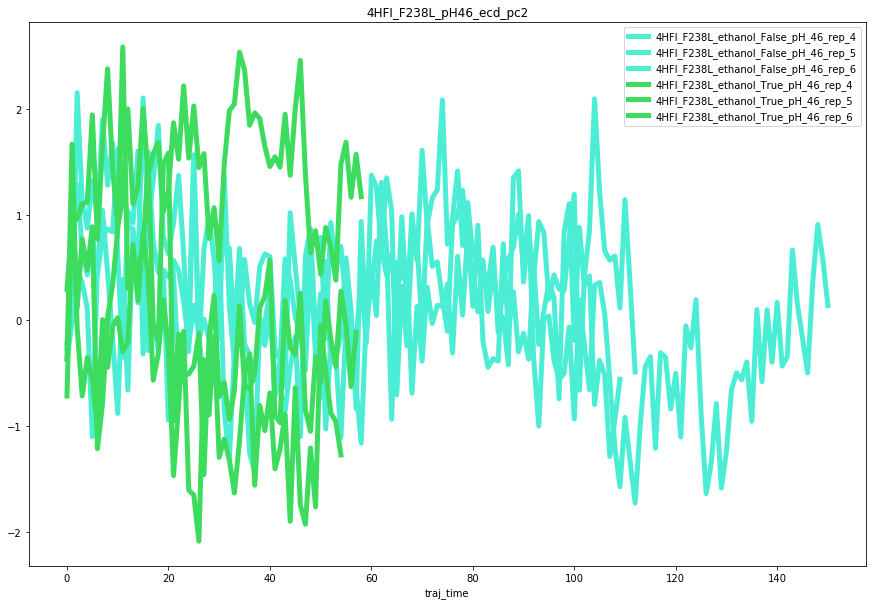

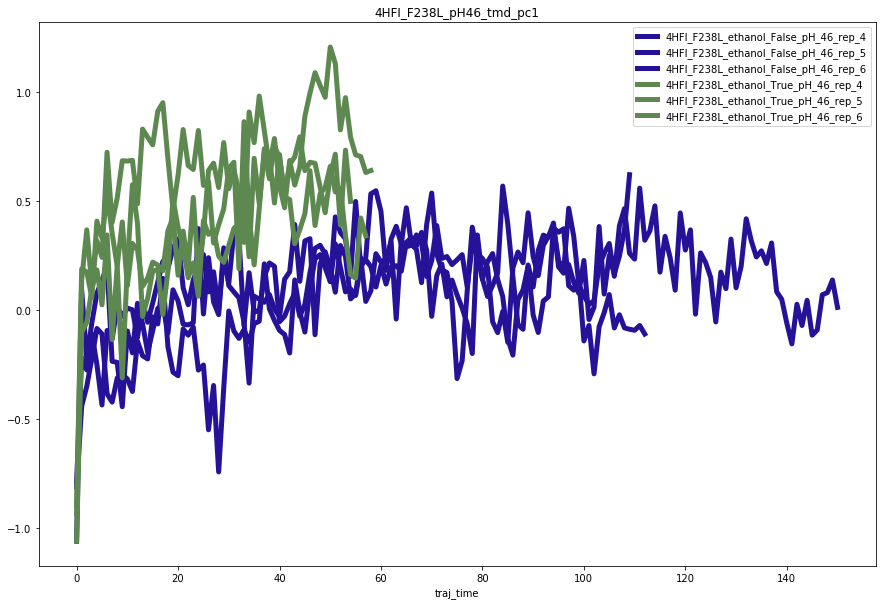

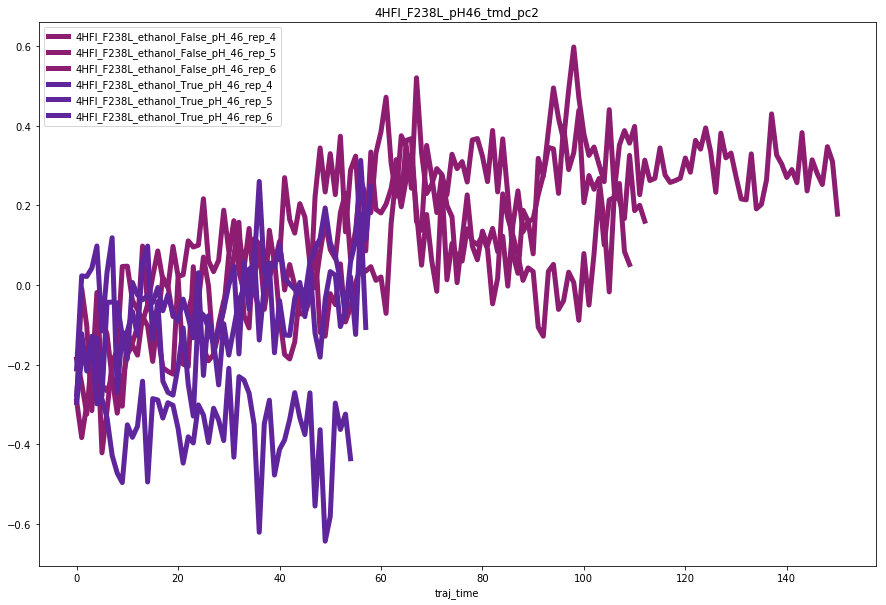

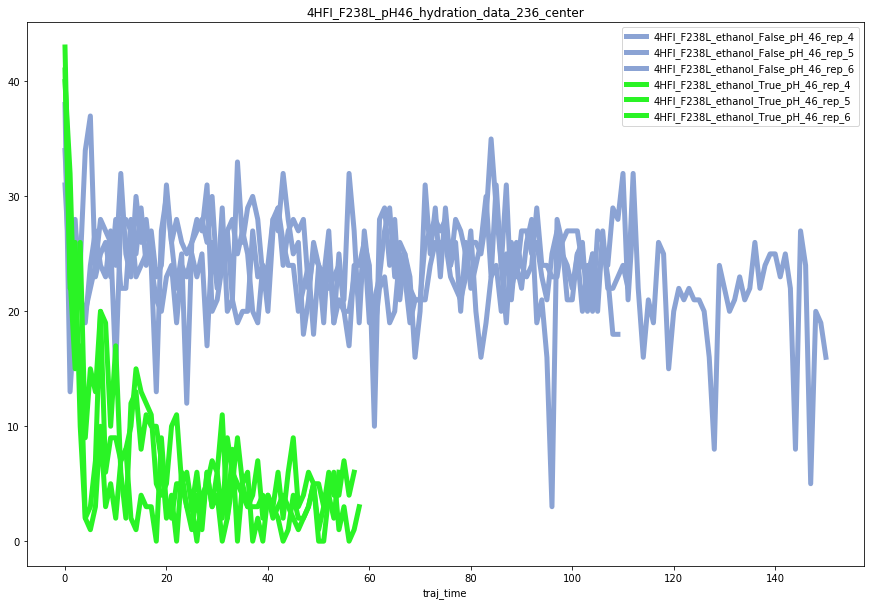

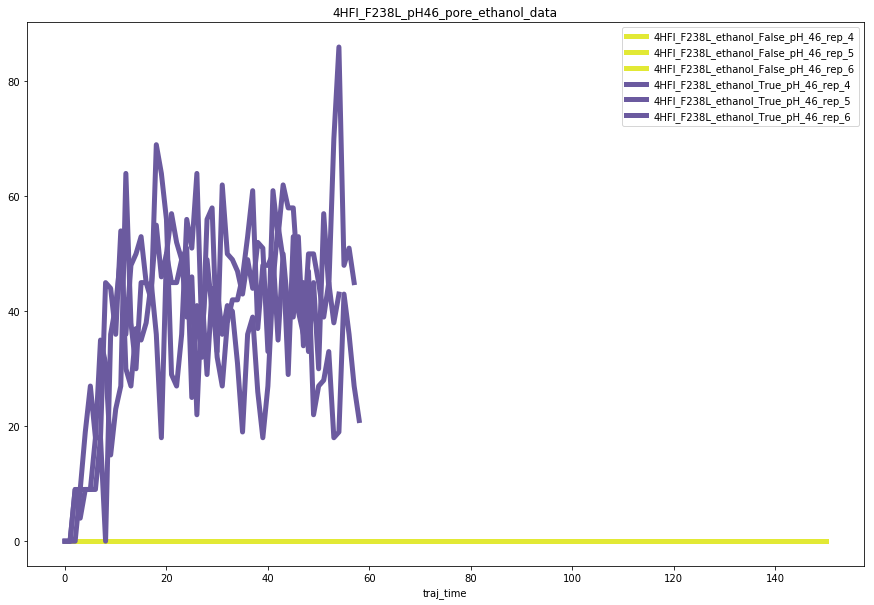

In [56]:
#2H
traj_notes = [ '4HFI_F238L_pH46_md4','4HFI_F238L_pH46_md5','4HFI_F238L_pH46_md6','4HFI_F238L_pH46_ethanol_md4','4HFI_F238L_pH46_ethanol_md5','4HFI_F238L_pH46_ethanol_md6']
default_location = '/home/scottzhuang/pdc/'
default_skip = 10
plot()

In 4HFI_I233T_pH46_md4, simulation runs 500 ns.
In 4HFI_I233T_pH46_md5, simulation runs 870 ns.
In 4HFI_I233T_pH46_md6, simulation runs 850 ns.
In 4HFI_I233T_pH46_ethanol_md1, simulation runs 500 ns.
In 4HFI_I233T_pH46_ethanol_md2, simulation runs 400 ns.
In 4HFI_I233T_pH46_ethanol_md3, simulation runs 410 ns.


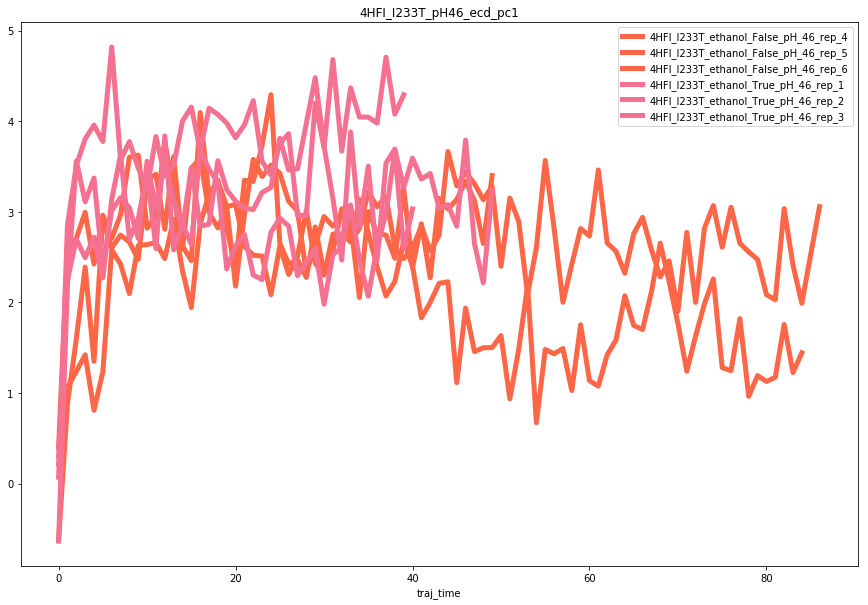

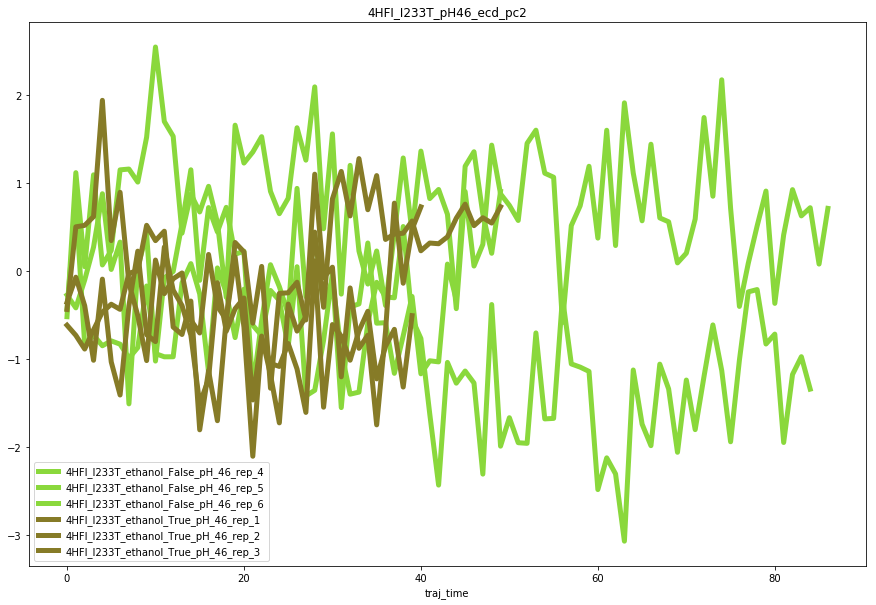

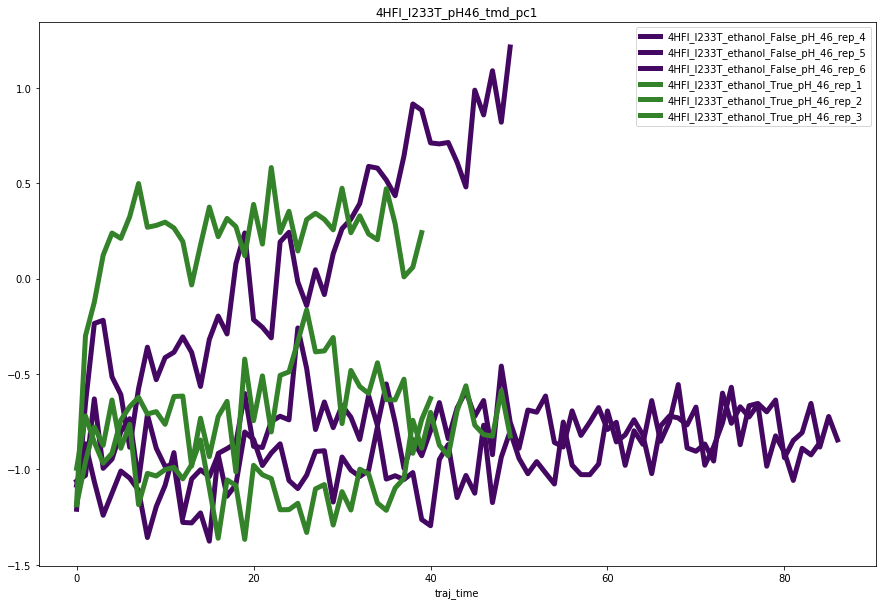

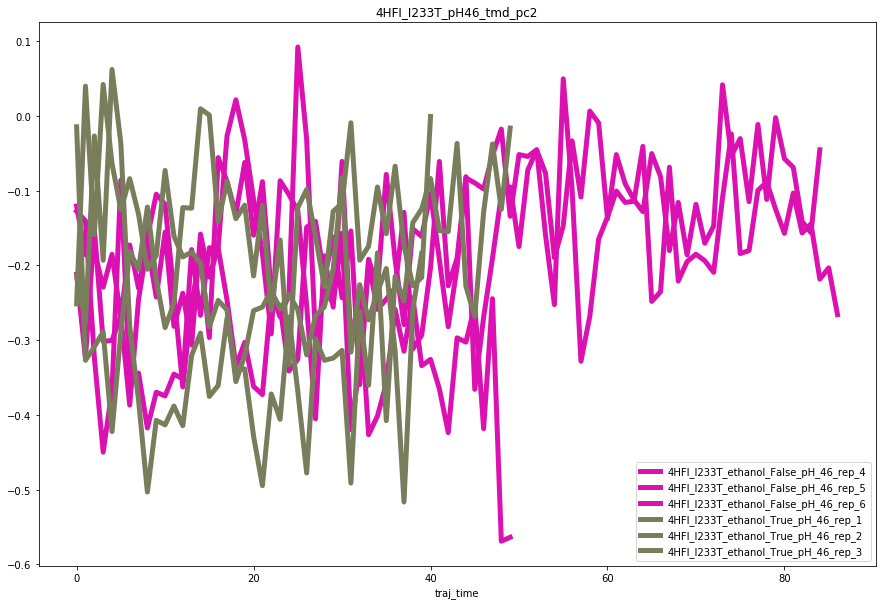

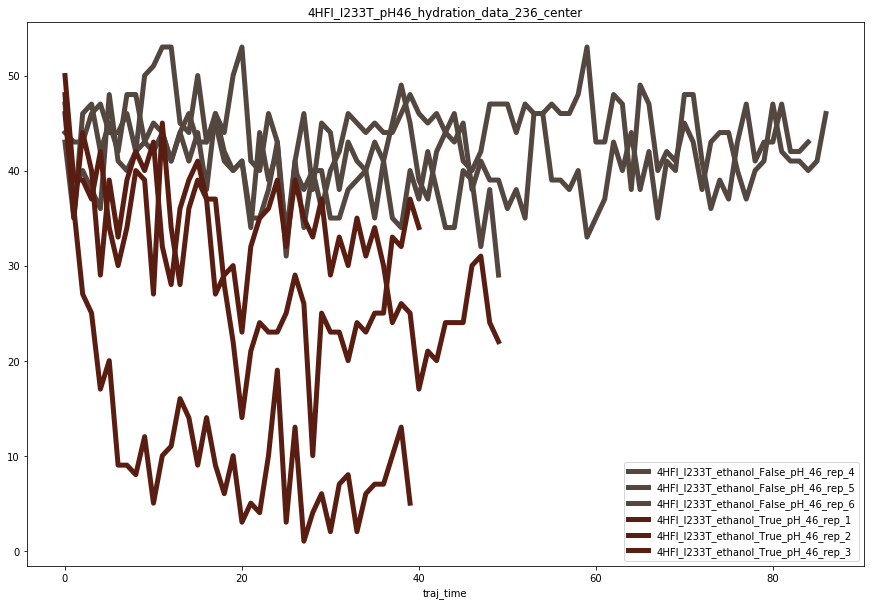

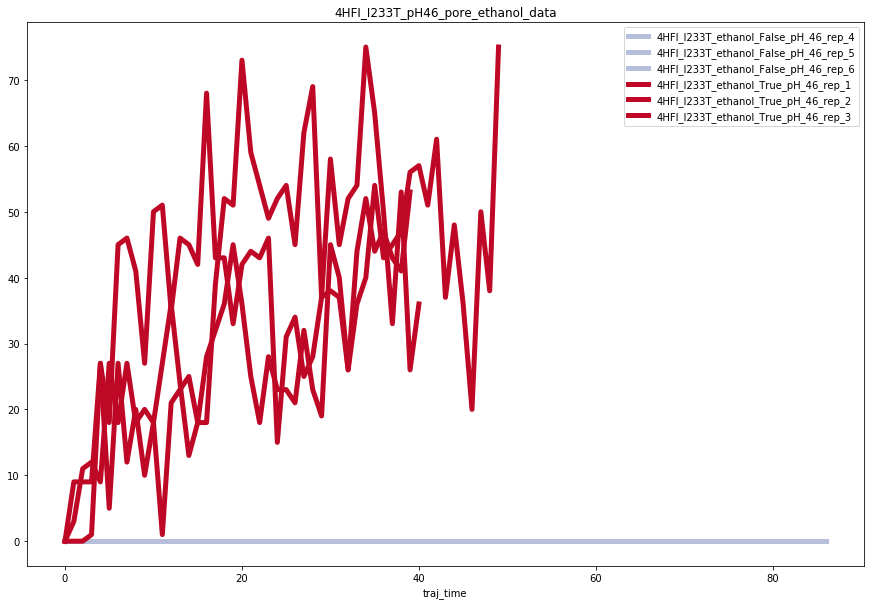

In [55]:
#2H
traj_notes = [ '4HFI_I233T_pH46_md4','4HFI_I233T_pH46_md5','4HFI_I233T_pH46_md6','4HFI_I233T_pH46_ethanol_md1','4HFI_I233T_pH46_ethanol_md2','4HFI_I233T_pH46_ethanol_md3']
default_location = '/home/scottzhuang/pdc/'
default_skip = 10
plot()

In 4HFI_F238LI233T_pH46_md4, simulation runs 1080 ns.
In 4HFI_F238LI233T_pH46_md5, simulation runs 870 ns.
In 4HFI_F238LI233T_pH46_md6, simulation runs 180 ns.
In 4HFI_F238LI233T_pH46_ethanol_md1, simulation runs 370 ns.
In 4HFI_F238LI233T_pH46_ethanol_md2, simulation runs 410 ns.
In 4HFI_F238LI233T_pH46_ethanol_md3, simulation runs 400 ns.


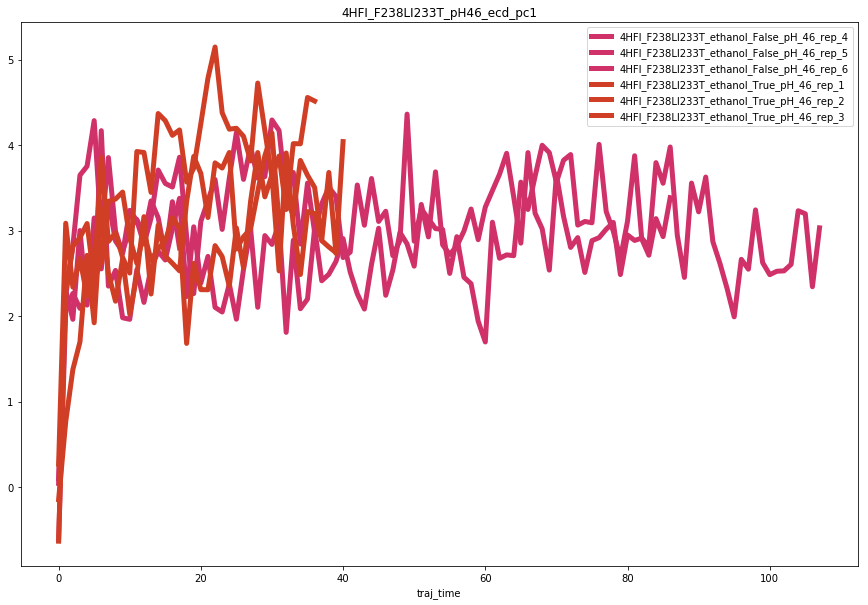

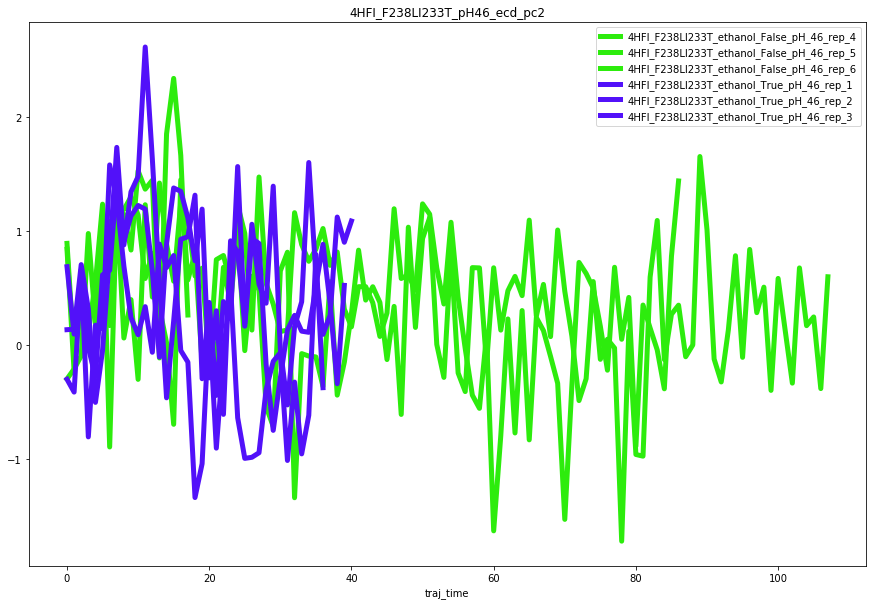

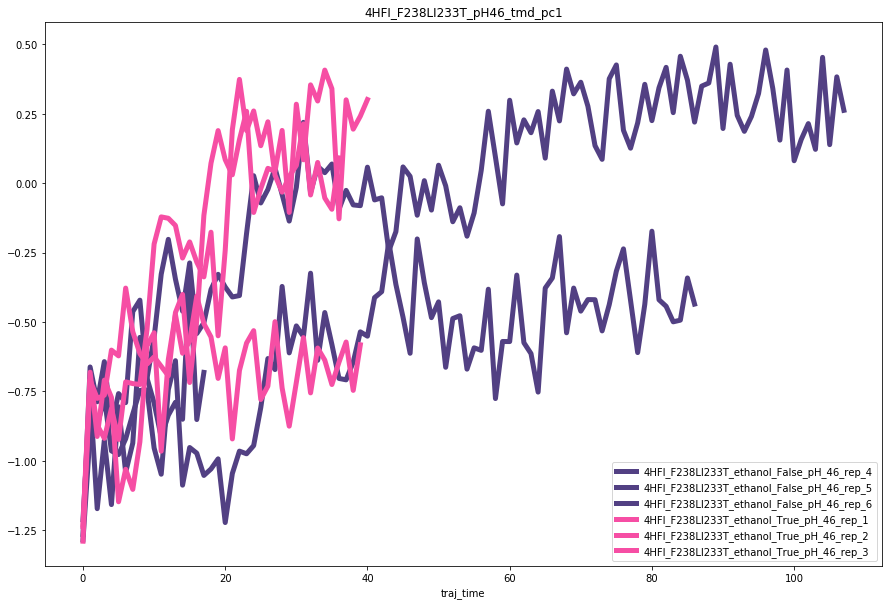

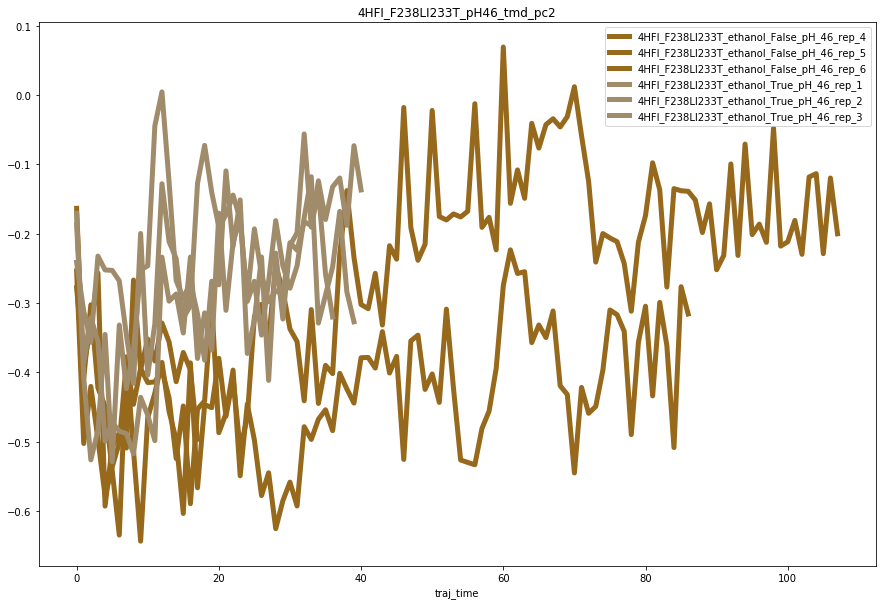

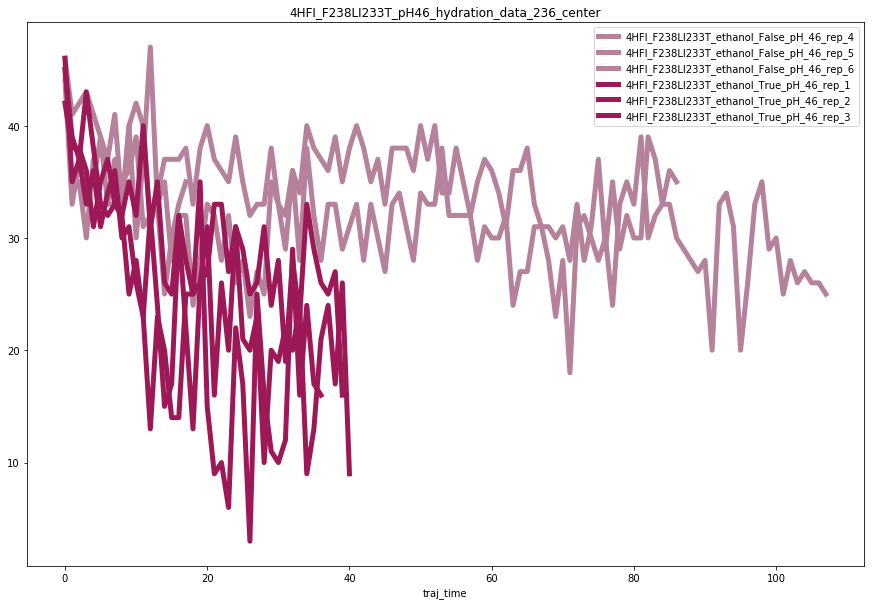

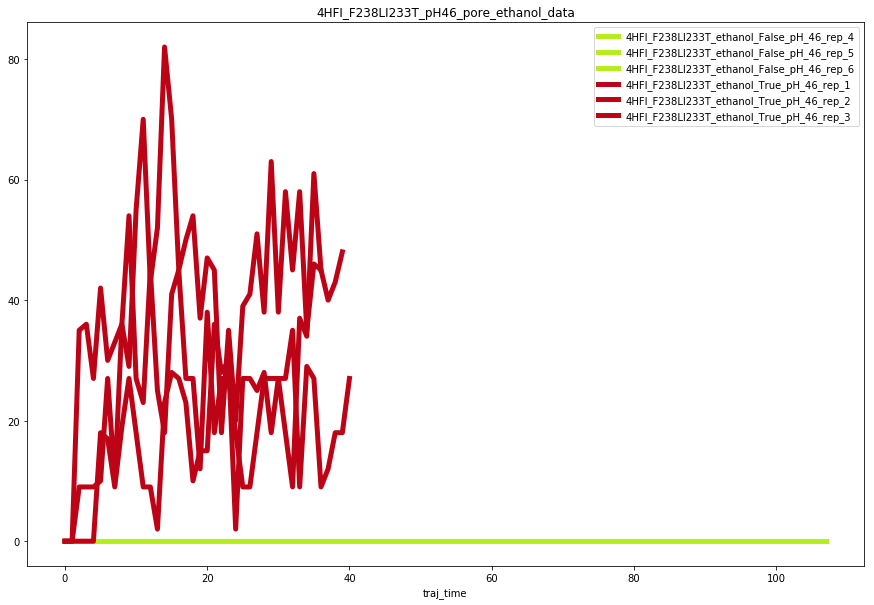

In [54]:
#2H
traj_notes = [ '4HFI_F238LI233T_pH46_md4','4HFI_F238LI233T_pH46_md5','4HFI_F238LI233T_pH46_md6','4HFI_F238LI233T_pH46_ethanol_md1','4HFI_F238LI233T_pH46_ethanol_md2','4HFI_F238LI233T_pH46_ethanol_md3']
default_location = '/home/scottzhuang/pdc/'
default_skip = 10
plot()